# Strategic Integration of Cutting Edge Analytics to Elevate and Resilience Supply Chain Operations

This study proposes an AI framework for supply chain operations to enhance resilience, efficiency, and ethical decision making.


The framework includes demand forecasting using deep learning model ,
resilience metrics for assessing and strengthening supply chain robustness, integrat on
of ethical practices, and explainable AI for transparent decision-making.

### Load Libraries

In [1]:
import pandas as pd
import numpy as np
import os
import joblib
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error, mean_squared_error
import tensorflow as tf
from tensorflow.keras import layers

In [2]:
# create folders to save outputs 
interim_path = "./interim_data/" 
if not os.path.exists(interim_path):
    os.makedirs(interim_path)

output_path = "./output/" 
if not os.path.exists(output_path):
    os.makedirs(output_path)

### Load Dataset

Dataset Source: [dataco-smart-supply-chain-for-big-data-analysis](https://www.kaggle.com/datasets/shashwatwork/dataco-smart-supply-chain-for-big-data-analysis/data)

The dataset consists of supply chain data utilized by the company DataCo Global. It includes various attributes related to the flow of goods and services within the company's supply chain network.

In [3]:
data = pd.read_csv("./data/DataCoSupplyChainDataset.csv", encoding='ISO-8859-1')

In [4]:
print(f"Shape of the data: {data.shape}")

Shape of the data: (180519, 53)


In [5]:
data.head(3)

,Type,Days for shipping (real),Days for shipment (scheduled),Benefit per order,Sales per customer,Delivery Status,Late_delivery_risk,Category Id,Category Name,Customer City,...,Order Zipcode,Product Card Id,Product Category Id,Product Description,Product Image,Product Name,Product Price,Product Status,shipping date (DateOrders),Shipping Mode
0,DEBIT,3,4,91.250000,314.640015,Advance shipping,0,73,Sporting Goods,Caguas,...,NaN,1360,73,NaN,http://images.acmesports.sports/Smart+watch,Smart watch,327.75,0,2/3/2018 22:56,Standard Class
1,TRANSFER,5,4,-249.089996,311.359985,Late delivery,1,73,Sporting Goods,Caguas,...,NaN,1360,73,NaN,http://images.acmesports.sports/Smart+watch,Smart watch,327.75,0,1/18/2018 12:27,Standard Class
2,CASH,4,4,-247.779999,309.720001,Shipping on time,0,73,Sporting Goods,San Jose,...,NaN,1360,73,NaN,http://images.acmesports.sports/Smart+watch,Smart watch,327.75,0,1/17/2018 12:06,Standard Class


In [6]:
print(f"Columns in the data: \n{data.columns.tolist()}")

Columns in the data: 
['Type', 'Days for shipping (real)', 'Days for shipment (scheduled)', 'Benefit per order', 'Sales per customer', 'Delivery Status', 'Late_delivery_risk', 'Category Id', 'Category Name', 'Customer City', 'Customer Country', 'Customer Email', 'Customer Fname', 'Customer Id', 'Customer Lname', 'Customer Password', 'Customer Segment', 'Customer State', 'Customer Street', 'Customer Zipcode', 'Department Id', 'Department Name', 'Latitude', 'Longitude', 'Market', 'Order City', 'Order Country', 'Order Customer Id', 'order date (DateOrders)', 'Order Id', 'Order Item Cardprod Id', 'Order Item Discount', 'Order Item Discount Rate', 'Order Item Id', 'Order Item Product Price', 'Order Item Profit Ratio', 'Order Item Quantity', 'Sales', 'Order Item Total', 'Order Profit Per Order', 'Order Region', 'Order State', 'Order Status', 'Order Zipcode', 'Product Card Id', 'Product Category Id', 'Product Description', 'Product Image', 'Product Name', 'Product Price', 'Product Status', 's

# Data CleanUp

In [7]:
# retain required columns
retain_columns = [
    'Product Name',
    'Sales per customer',
    'Benefit per order',
    'Order Item Discount',
    'Order Item Discount Rate',
    'Order Item Product Price',
    'Order Item Profit Ratio',
    'Sales',
    'Order Item Total',
    'Order Profit Per Order',
    'Days for shipping (real)',
    'Days for shipment (scheduled)',
    'Delivery Status',
    'Late_delivery_risk',
    'Shipping Mode',
    'Customer Segment',
    'order date (DateOrders)',
    'Order Item Quantity'
]

data = data[retain_columns]
print(f"New shape of the data: {data.shape}")
data.head(3)

New shape of the data: (180519, 18)


,Product Name,Sales per customer,Benefit per order,Order Item Discount,Order Item Discount Rate,Order Item Product Price,Order Item Profit Ratio,Sales,Order Item Total,Order Profit Per Order,Days for shipping (real),Days for shipment (scheduled),Delivery Status,Late_delivery_risk,Shipping Mode,Customer Segment,order date (DateOrders),Order Item Quantity
0,Smart watch,314.640015,91.250000,13.110000,0.04,327.75,0.29,327.75,314.640015,91.250000,3,4,Advance shipping,0,Standard Class,Consumer,1/31/2018 22:56,1
1,Smart watch,311.359985,-249.089996,16.389999,0.05,327.75,-0.80,327.75,311.359985,-249.089996,5,4,Late delivery,1,Standard Class,Consumer,1/13/2018 12:27,1
2,Smart watch,309.720001,-247.779999,18.030001,0.06,327.75,-0.80,327.75,309.720001,-247.779999,4,4,Shipping on time,0,Standard Class,Consumer,1/13/2018 12:06,1


# EDA

Top 10 Products by Frequency

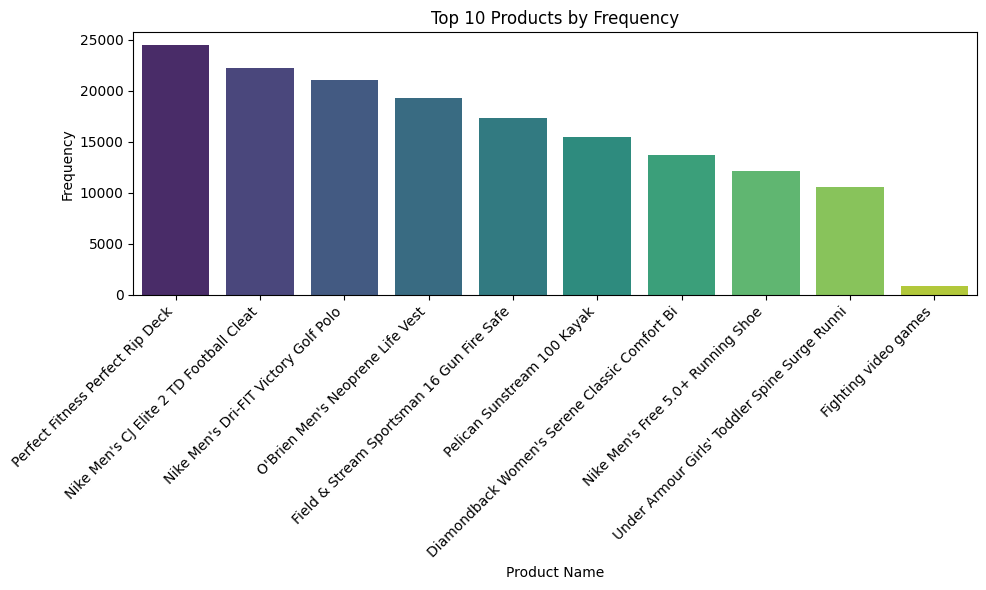

In [8]:
# Calculate the frequency counts of each product name
product_counts = data['Product Name'].value_counts().head(10)

# Create a bar plot using seaborn
plt.figure(figsize=(10, 6))
sns.barplot(x=product_counts.index, y=product_counts.values, palette='viridis')
plt.title('Top 10 Products by Frequency')
plt.xlabel('Product Name')
plt.ylabel('Frequency')
plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels for better readability
plt.tight_layout()
plt.show()


The dataset comprises supply chain data spanning from 2015 to 2017 for 118 distinct products. Our objective is to perform demand forecasting for these products. For instance, based on historical data, we aim to predict the demand for a specific product in the upcoming week. To achieve this, we intend to develop individual forecasting models for each product, utilizing weekly order data.

In this notebook, we focus on the top 3 products, seeking to analyze their historical order patterns and construct predictive models to forecast their demand. By leveraging the available data spanning multiple years, we aim to capture underlying trends and seasonality factors unique to each product, thereby enhancing the accuracy of our forecasts.

In [9]:
# filter the data for top 3 products
# Calculate the frequency counts of each product name
product_counts = data['Product Name'].value_counts()
# Select the top 3 products
top_3_products = product_counts.head(3).index

filtered_data_dict = {}
for each_product in top_3_products:
    # Filter the data for the top 3 products
    filtered_data = data[data['Product Name']==each_product]
    filtered_data = filtered_data.reset_index(drop=True)
    print(f"New shape of the data for product '{each_product}': {filtered_data.shape}")
    start_date = filtered_data['order date (DateOrders)'].min()
    end_date = filtered_data['order date (DateOrders)'].max()
    print("\tStart Date:", start_date)
    print("\tEnd Date:", end_date)
    filtered_data_dict[each_product] = filtered_data
    # to save results later in respective folders
    product_output_path = os.path.join(output_path, "_".join(each_product.split()))
    if not os.path.exists(product_output_path):
        os.makedirs(product_output_path)
    print("\n")

New shape of the data for product 'Perfect Fitness Perfect Rip Deck': (24515, 18)
	Start Date: 1/1/2015 12:36
	End Date: 9/9/2017 9:08


New shape of the data for product 'Nike Men's CJ Elite 2 TD Football Cleat': (22246, 18)
	Start Date: 1/1/2015 0:21
	End Date: 9/9/2017 9:08


New shape of the data for product 'Nike Men's Dri-FIT Victory Golf Polo': (21035, 18)
	Start Date: 1/1/2015 0:21
	End Date: 9/9/2017 9:08




# Modules for Data Transformation

In [10]:
def create_temporal_features(df):
    # convert to datetime
    df['order date (DateOrders)'] = pd.to_datetime(df['order date (DateOrders)'])
    # extract date
    df['ORDER_DATE'] = df['order date (DateOrders)'].dt.date
    # convert to date
    df['ORDER_DATE'] = pd.to_datetime(df['ORDER_DATE'])
    # drop columns
    df.drop(columns = 'order date (DateOrders)', inplace=True) 
    # extract week start and end
    df['YEAR_WEEK'] = df['ORDER_DATE'].dt.to_period('W')
    # Create a binary flag for weekends - 1 for Saturday or Sunday, 0 for weekdays
    df['WEEKEND'] = df['ORDER_DATE'].dt.dayofweek // 5
    return df

In [11]:
def shipment_delay(df):
    # calculate the difference between 'Days for shipping (real)' and 'Days for shipment (scheduled)'
    df['SHIPPING_DELAY'] = df['Days for shipping (real)'] - df['Days for shipment (scheduled)']
    return df

In [12]:
def aggregate_features(df):
    # Define aggregation functions for each column
    aggregations = {
        'Sales per customer': 'mean',
        'Benefit per order': 'sum',
        'Order Item Discount': 'sum',
        'Order Item Discount Rate': 'mean',
        'Order Item Product Price': 'mean',
        'Order Item Profit Ratio': 'mean',
        'Sales': 'sum',
        'Order Item Total': 'sum',
        'Order Profit Per Order': 'sum',
        'Days for shipping (real)': 'mean',
        'Days for shipment (scheduled)': 'mean',
        'Delivery Status': lambda x: x.mode().iloc[0],  # Most common delivery status
        'Order Item Quantity': 'sum',
        'Late_delivery_risk': 'mean',
        'Shipping Mode': lambda x: x.mode().iloc[0],  # Most common shipping mode
        'Customer Segment': lambda x: x.mode().iloc[0],  # Most common customer segment
        #'WEEKEND': lambda x: (x == 1).mean() * 100,  # Convert to percentage
        'WEEKEND': lambda x: x.mode().iloc[0],
        'SHIPPING_DELAY': 'mean'
        # Add more columns and aggregation functions as needed
    }
    
    # Group by YEAR_WEEK and apply aggregations
    aggregated_data = df.groupby('YEAR_WEEK').agg(aggregations).reset_index()
    return aggregated_data

In [13]:
def correlation_matrix_plot(df, product):
    correlation_matrix = corr_data.corr()
    # Plot the correlation matrix
    plt.figure(figsize=(8, 6))
    sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5)
    plt.title(f'{product}: Correlation Matrix')
    plt.show()

In [14]:
def time_based_split(df):
    # Convert YEAR_WEEK to string
    df['YEAR_WEEK'] = df['YEAR_WEEK'].astype(str)
    
    # Split the data into train and test based on YEAR_WEEK
    train_data = df[df['YEAR_WEEK'].str[:4] != '2017']  # Train data contains all years except 2017
    test_data = df[df['YEAR_WEEK'].str[:4] == '2017']   # Test data contains only 2017
    
    # Reset index for train and test data
    train_data.reset_index(drop=True, inplace=True)
    test_data.reset_index(drop=True, inplace=True)

    return train_data, test_data

In [15]:
def evaluate_model(y_true, y_pred):
    mae = mean_absolute_error(y_true, y_pred)
    mse = mean_squared_error(y_true, y_pred)
    rmse = np.sqrt(mse)
    return mae, mse, rmse

In [16]:
def plot_prediction_results(train_results, test_results, model_name, prod_name):
    # Group by YEAR_WEEK and calculate mean values for train and test datasets
    train_results['YEAR_WEEK'] = pd.to_datetime(train_results['YEAR_WEEK'].str.split('/').str[0])  # Convert to datetime
    train_results = train_results.groupby('YEAR_WEEK').mean().reset_index()
    test_results['YEAR_WEEK'] = pd.to_datetime(test_results['YEAR_WEEK'].str.split('/').str[0])  # Convert to datetime
    test_results = test_results.groupby('YEAR_WEEK').mean().reset_index()
    
    # Plot actual vs predicted values for train and test datasets
    plt.figure(figsize=(15, 6))
    plt.plot(train_results['YEAR_WEEK'], train_results['Actual'], color='blue', label='Train Actual', marker='o')
    plt.plot(train_results['YEAR_WEEK'], train_results['Predicted'], color='red', label='Train Predicted', marker='o')
    plt.plot(test_results['YEAR_WEEK'], test_results['Actual'], color='green', label='Test Actual', marker='o')
    plt.plot(test_results['YEAR_WEEK'], test_results['Predicted'], color='orange', label='Test Predicted', marker='o')
    plt.title(f'{model_name} for {prod_name}: Actual vs Predicted Values by Week')
    plt.xlabel('Date')
    plt.ylabel('Order Item Quantity')
    plt.xticks(rotation=45)
    plt.legend()
    plt.grid(True)
    plt.savefig(os.path.join(output_path, prod_name, f'{model_name}.png'))
    plt.show()

# Feature Engineering 

In [17]:
# temporal features
for product in filtered_data_dict:
    product_df = create_temporal_features(filtered_data_dict[product])
    filtered_data_dict[product] = product_df
    print(f"Shape of the data for product '{product}': {product_df.shape}")

Shape of the data for product 'Perfect Fitness Perfect Rip Deck': (24515, 20)
Shape of the data for product 'Nike Men's CJ Elite 2 TD Football Cleat': (22246, 20)
Shape of the data for product 'Nike Men's Dri-FIT Victory Golf Polo': (21035, 20)


In [18]:
# shipment delay
for product in filtered_data_dict:
    product_df = shipment_delay(filtered_data_dict[product])
    filtered_data_dict[product] = product_df
    print(f"Shape of the data for product '{product}': {product_df.shape}")

Shape of the data for product 'Perfect Fitness Perfect Rip Deck': (24515, 21)
Shape of the data for product 'Nike Men's CJ Elite 2 TD Football Cleat': (22246, 21)
Shape of the data for product 'Nike Men's Dri-FIT Victory Golf Polo': (21035, 21)


In [19]:
# aggregate features
for product in filtered_data_dict:
    product_df = aggregate_features(filtered_data_dict[product])
    filtered_data_dict[product] = product_df
    print(f"Shape of the data for product '{product}': {product_df.shape}")

Shape of the data for product 'Perfect Fitness Perfect Rip Deck': (145, 19)
Shape of the data for product 'Nike Men's CJ Elite 2 TD Football Cleat': (145, 19)
Shape of the data for product 'Nike Men's Dri-FIT Victory Golf Polo': (145, 19)


#### Data Cleaning

In [20]:
# Drop columns from the data
columns_to_drop = ["Shipping Mode", "Customer Segment", "Delivery Status"]
for product in filtered_data_dict:
    product_df = filtered_data_dict[product].drop(columns_to_drop, axis=1)
    filtered_data_dict[product] = product_df
    print(f"Shape of the data for product '{product}': {product_df.shape}")

Shape of the data for product 'Perfect Fitness Perfect Rip Deck': (145, 16)
Shape of the data for product 'Nike Men's CJ Elite 2 TD Football Cleat': (145, 16)
Shape of the data for product 'Nike Men's Dri-FIT Victory Golf Polo': (145, 16)


In [21]:
filtered_data_dict.keys()

dict_keys(['Perfect Fitness Perfect Rip Deck', "Nike Men's CJ Elite 2 TD Football Cleat", "Nike Men's Dri-FIT Victory Golf Polo"])

In [22]:
filtered_data_dict['Perfect Fitness Perfect Rip Deck'].head(2)

,YEAR_WEEK,Sales per customer,Benefit per order,Order Item Discount,Order Item Discount Rate,Order Item Product Price,Order Item Profit Ratio,Sales,Order Item Total,Order Profit Per Order,Days for shipping (real),Days for shipment (scheduled),Order Item Quantity,Late_delivery_risk,WEEKEND,SHIPPING_DELAY
0,2014-12-29/2015-01-04,157.804288,2270.650002,1787.510014,0.098286,59.990002,0.103810,18356.940541,16569.450245,2270.650002,3.733333,3.152381,306,0.580952,1,0.580952
1,2015-01-05/2015-01-11,161.270116,3839.980033,3351.210040,0.105398,59.990002,0.127955,31734.710922,28383.540386,3839.980033,3.539773,3.000000,529,0.534091,0,0.539773


In [23]:
filtered_data_dict["Nike Men's CJ Elite 2 TD Football Cleat"].head(2)

,YEAR_WEEK,Sales per customer,Benefit per order,Order Item Discount,Order Item Discount Rate,Order Item Product Price,Order Item Profit Ratio,Sales,Order Item Total,Order Profit Per Order,Days for shipping (real),Days for shipment (scheduled),Order Item Quantity,Late_delivery_risk,WEEKEND,SHIPPING_DELAY
0,2014-12-29/2015-01-04,116.432856,617.440005,1043.899997,0.104545,129.990005,0.071429,10009.230423,8965.329933,617.440005,3.844156,3.402597,77,0.467532,0,0.441558
1,2015-01-05/2015-01-11,116.848503,2170.289984,1931.799994,0.101361,129.990005,0.130544,19108.530808,17176.729873,2170.289984,3.523810,3.170068,147,0.469388,0,0.353741


In [24]:
filtered_data_dict["Nike Men's Dri-FIT Victory Golf Polo"].head(2)

,YEAR_WEEK,Sales per customer,Benefit per order,Order Item Discount,Order Item Discount Rate,Order Item Product Price,Order Item Profit Ratio,Sales,Order Item Total,Order Profit Per Order,Days for shipping (real),Days for shipment (scheduled),Order Item Quantity,Late_delivery_risk,WEEKEND,SHIPPING_DELAY
0,2014-12-29/2015-01-04,124.336420,436.200006,1078.75,0.100000,50.0,0.055679,11150.0,10071.25,436.200006,3.753086,3.222222,223,0.555556,1,0.530864
1,2015-01-05/2015-01-11,139.163934,1163.130012,1922.00,0.103197,50.0,0.097951,18900.0,16978.00,1163.130012,3.729508,3.155738,378,0.573770,0,0.573770


# EDA

In [25]:
data_list = []
for product in filtered_data_dict:
    tmp_df = filtered_data_dict[product].copy()
    tmp_df["Product Name"] = product
    tmp_df["Week"] = tmp_df["YEAR_WEEK"].apply(lambda row: str(row).split("/")[0])
    tmp_df["Week"] = pd.to_datetime(tmp_df["Week"])
    data_list.append(tmp_df)

eda_data = pd.concat(data_list)
eda_data = eda_data.reset_index(drop=True)
eda_data.columns

Index(['YEAR_WEEK', 'Sales per customer', 'Benefit per order',
       'Order Item Discount', 'Order Item Discount Rate',
       'Order Item Product Price', 'Order Item Profit Ratio', 'Sales',
       'Order Item Total', 'Order Profit Per Order',
       'Days for shipping (real)', 'Days for shipment (scheduled)',
       'Order Item Quantity', 'Late_delivery_risk', 'WEEKEND',
       'SHIPPING_DELAY', 'Product Name', 'Week'],
      dtype='object')

**Distribution of Orders Over Time for Top 3 Products**

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


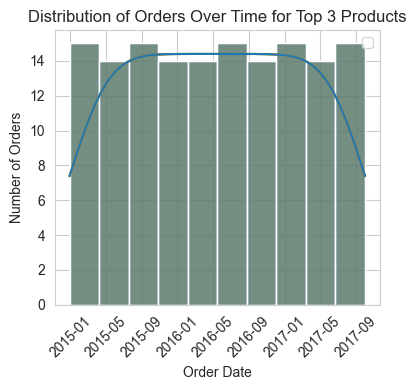

In [26]:
# Set Seaborn style
sns.set_style("whitegrid")

# Plot the count of orders over time
plt.figure(figsize=(4, 4))
# Plot histogram with hue for Product Name
sns.histplot(data=eda_data, x='Week', kde=True, hue='Product Name')

plt.title('Distribution of Orders Over Time for Top 3 Products')
plt.xlabel('Order Date')
plt.ylabel('Number of Orders')
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
plt.legend()
plt.tight_layout() 
plt.show()

**Order Item Quantity Over Week for 3 Different Products**

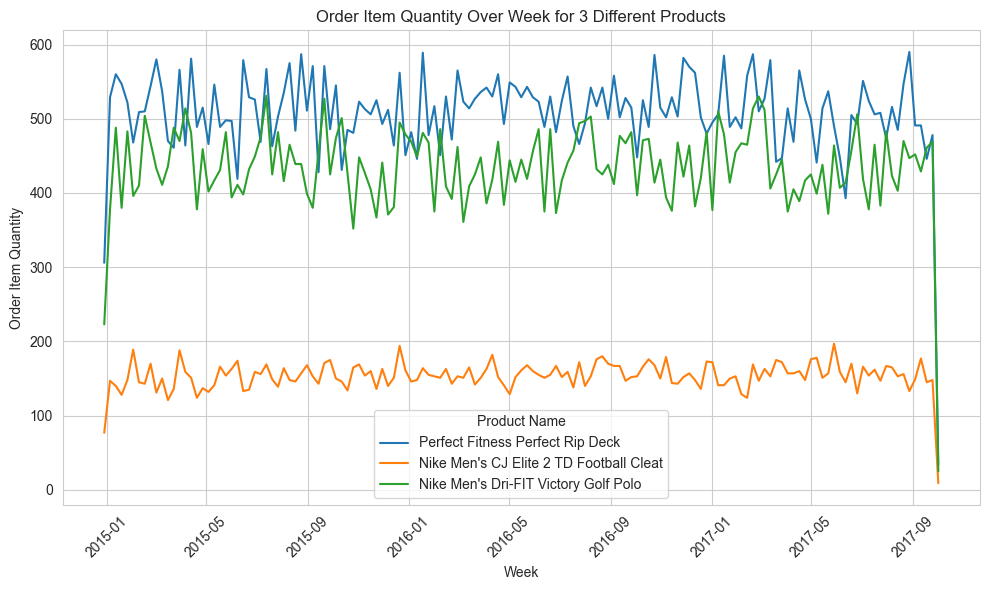

In [27]:
# Plot the line plot
plt.figure(figsize=(10, 6))
sns.lineplot(data=eda_data, x='Week', y='Order Item Quantity', hue='Product Name')

# Set labels and title
plt.title('Order Item Quantity Over Week for 3 Different Products')
plt.xlabel('Week')
plt.ylabel('Order Item Quantity')

# Show plot
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
plt.tight_layout()
plt.show()

**Average Shipping Delay by Product**

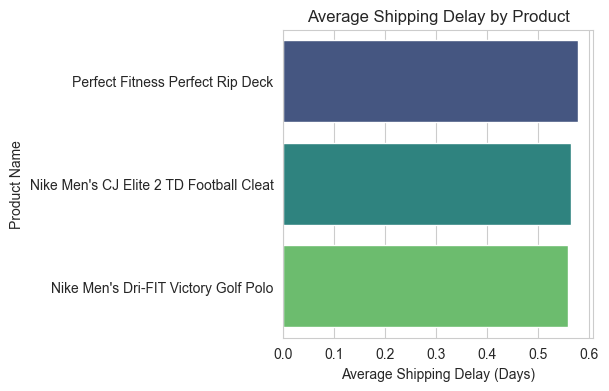

In [28]:
# Group the data by 'Product Name' and calculate the average shipping delay
shipping_delay_by_product = eda_data.groupby('Product Name')['SHIPPING_DELAY'].mean().reset_index()

# Sort the data by average shipping delay
shipping_delay_by_product = shipping_delay_by_product.sort_values(by='SHIPPING_DELAY', ascending=False)

# Plot
plt.figure(figsize=(4, 4))
sns.barplot(data=shipping_delay_by_product, x='SHIPPING_DELAY', y='Product Name', palette='viridis')
plt.title('Average Shipping Delay by Product')
plt.xlabel('Average Shipping Delay (Days)')
plt.ylabel('Product Name')
plt.show()


**Distribution of Order Item Quantity for Different Products**

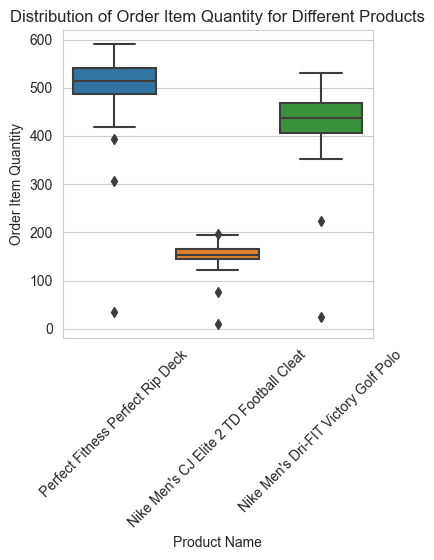

In [29]:
# Plot the distribution of Order Item Quantity for different products
plt.figure(figsize=(4, 4))
sns.boxplot(x='Product Name', y='Order Item Quantity', data=eda_data)
plt.title('Distribution of Order Item Quantity for Different Products')
plt.xlabel('Product Name')
plt.ylabel('Order Item Quantity')
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
plt.show()

**Total Sales for Different Products**

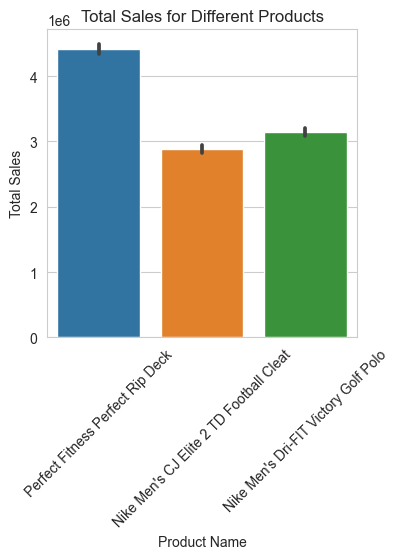

In [30]:
# Compare the performance of different products based on sales metrics and other relevant variables
plt.figure(figsize=(4, 4))
sns.barplot(x='Product Name', y='Sales', data=eda_data, estimator=sum)
plt.title('Total Sales for Different Products')
plt.xlabel('Product Name')
plt.ylabel('Total Sales')
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
plt.show()


**Impact of Weekends on Average Order Item Quantity**

Text(0, 0.5, 'Average Order Item Quantity')

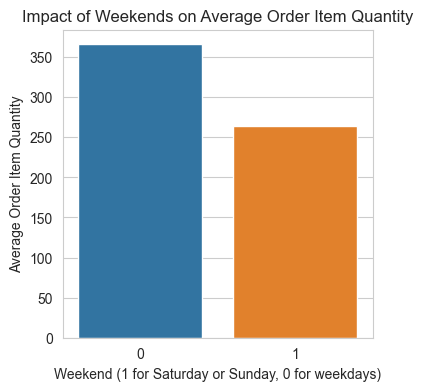

In [31]:
# Plot the average Order Item Quantity for weekends and weekdays
plt.figure(figsize=(4,4))
sns.barplot(x='WEEKEND', y='Order Item Quantity', data=eda_data, ci=None)
plt.title('Impact of Weekends on Average Order Item Quantity')
plt.xlabel('Weekend (1 for Saturday or Sunday, 0 for weekdays)')
plt.ylabel('Average Order Item Quantity')

# Correlation Matrix

In [32]:
z

NameError: name 'z' is not defined

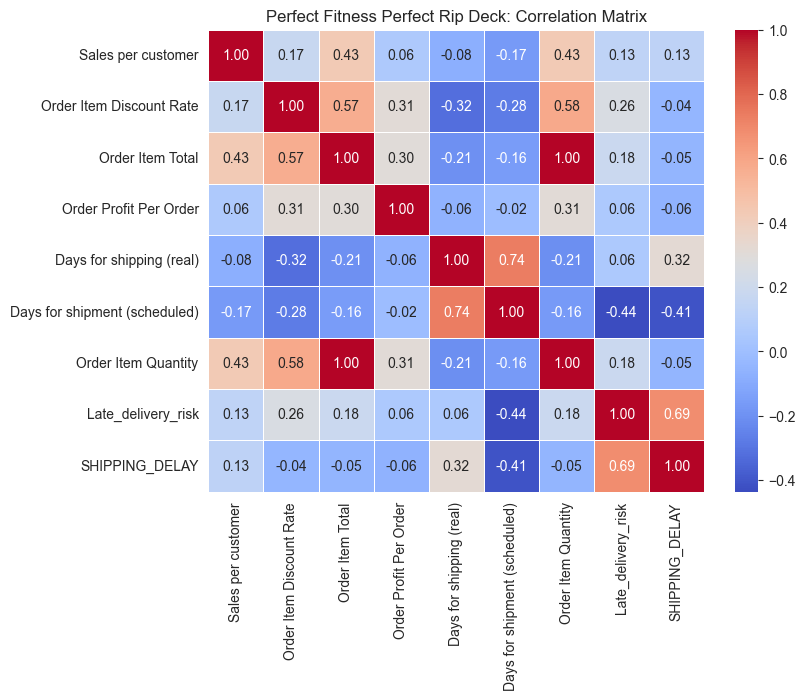

In [34]:
product = 'Perfect Fitness Perfect Rip Deck'
corr_data = filtered_data_dict[product].copy()
corr_data = corr_data.drop(['YEAR_WEEK', 'Benefit per order', 'Order Item Discount', 'Order Item Product Price', 'WEEKEND','Order Item Profit Ratio', 'Sales'], axis=1)
correlation_matrix_plot(corr_data, product)

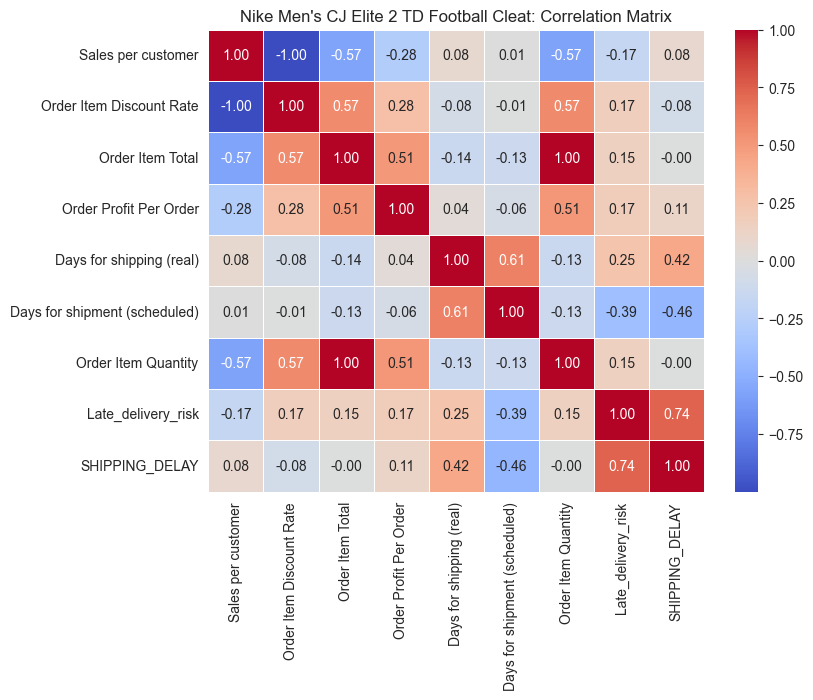

In [36]:
product = "Nike Men's CJ Elite 2 TD Football Cleat"
corr_data = filtered_data_dict[product].copy()
corr_data = corr_data.drop(['YEAR_WEEK', 'Benefit per order', 'Order Item Discount','Order Item Product Price', 'WEEKEND', 'Order Item Profit Ratio', 'Sales'], axis=1)
correlation_matrix_plot(corr_data, product)

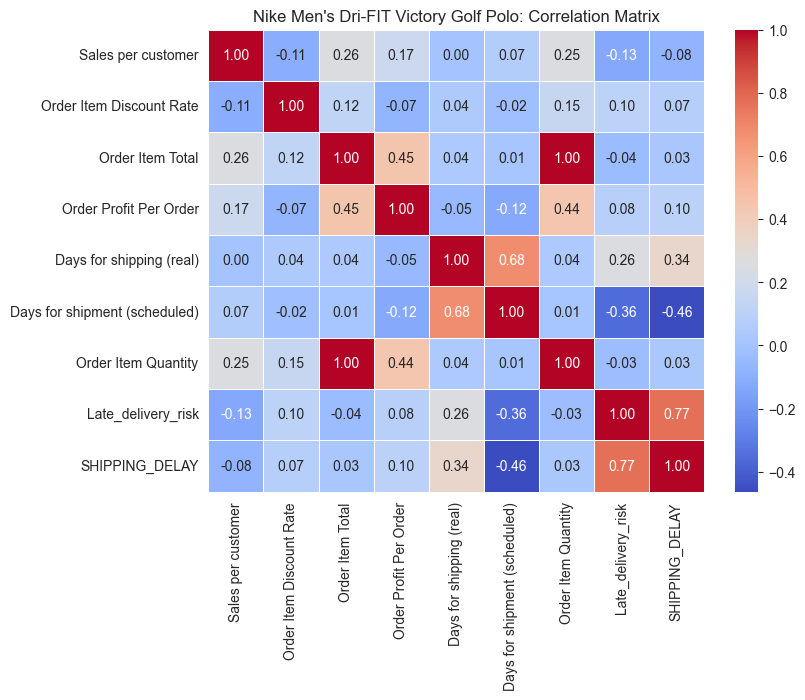

In [38]:
product = "Nike Men's Dri-FIT Victory Golf Polo"
corr_data = filtered_data_dict[product].copy()
corr_data = corr_data.drop(['YEAR_WEEK', 'Benefit per order', 'Order Item Discount','Order Item Product Price', 'WEEKEND','Order Item Profit Ratio', 'Sales'], axis=1)
correlation_matrix_plot(corr_data, product)

In [39]:
for product in filtered_data_dict:
    product_df = filtered_data_dict[product]
    product_df = product_df.drop(['Benefit per order', 'Order Item Discount', 'Order Item Product Price', 'WEEKEND','Order Item Profit Ratio', 'Sales'], axis=1)
    filtered_data_dict[product] = product_df
    print(f"Shape of the data for product '{product}': {product_df.shape}")
    print(f"Columns of the data for product '{product}': {product_df.columns.tolist()}")
    print("\n")

Shape of the data for product 'Perfect Fitness Perfect Rip Deck': (145, 10)
Columns of the data for product 'Perfect Fitness Perfect Rip Deck': ['YEAR_WEEK', 'Sales per customer', 'Order Item Discount Rate', 'Order Item Total', 'Order Profit Per Order', 'Days for shipping (real)', 'Days for shipment (scheduled)', 'Order Item Quantity', 'Late_delivery_risk', 'SHIPPING_DELAY']


Shape of the data for product 'Nike Men's CJ Elite 2 TD Football Cleat': (145, 10)
Columns of the data for product 'Nike Men's CJ Elite 2 TD Football Cleat': ['YEAR_WEEK', 'Sales per customer', 'Order Item Discount Rate', 'Order Item Total', 'Order Profit Per Order', 'Days for shipping (real)', 'Days for shipment (scheduled)', 'Order Item Quantity', 'Late_delivery_risk', 'SHIPPING_DELAY']


Shape of the data for product 'Nike Men's Dri-FIT Victory Golf Polo': (145, 10)
Columns of the data for product 'Nike Men's Dri-FIT Victory Golf Polo': ['YEAR_WEEK', 'Sales per customer', 'Order Item Discount Rate', 'Order Ite

# Train-Test Split

In [40]:
# train test split
for product in filtered_data_dict:
    product_df = filtered_data_dict[product]
    train_data, test_data = time_based_split(product_df)
    X_train = train_data.loc[:, train_data.columns != 'Order Item Quantity']
    y_train = train_data[["Order Item Quantity"]]
    X_test = test_data.loc[:, test_data.columns != 'Order Item Quantity']
    y_test = test_data[["Order Item Quantity"]]
    filtered_data_dict[product] = {"X_train": X_train, "y_train": y_train, "X_test": X_test, "y_test": y_test}
    # Print the shapes of train and test data
    print(f"{product}")
    print("\tTrain data shape:", train_data.shape)
    print("\tTest data shape:", test_data.shape)
    print("\n")

Perfect Fitness Perfect Rip Deck
	Train data shape: (105, 10)
	Test data shape: (40, 10)


Nike Men's CJ Elite 2 TD Football Cleat
	Train data shape: (105, 10)
	Test data shape: (40, 10)


Nike Men's Dri-FIT Victory Golf Polo
	Train data shape: (105, 10)
	Test data shape: (40, 10)




In [41]:
joblib.dump(train_data, os.path.join(interim_path, "train_data.pkl"))
joblib.dump(test_data, os.path.join(interim_path, "test_data.pkl"))

['./interim_data/test_data.pkl']

# Model Training with Hyperparameter Tuning + 5-Fold Cross Validation

#### Random Forest Regressor

In [42]:
regression_data = {}
for product in filtered_data_dict:
    X_train = filtered_data_dict[product]["X_train"]
    X_train_reg = X_train.loc[:, X_train.columns != 'YEAR_WEEK']
    y_train_reg = filtered_data_dict[product]["y_train"].copy()
    X_test = filtered_data_dict[product]["X_test"]
    X_test_reg = X_test.loc[:, X_test.columns != 'YEAR_WEEK']
    y_test_reg = filtered_data_dict[product]["y_test"].copy()
    regression_data[product] = {"X_train": X_train_reg, "y_train": y_train_reg, "X_test": X_test_reg, "y_test": y_test_reg}
    print(f"{product}")
    print("\tTrain data shape:", X_train_reg.shape)
    print("\tTest data shape:", X_test_reg.shape)
    print("\n")

Perfect Fitness Perfect Rip Deck
	Train data shape: (105, 8)
	Test data shape: (40, 8)


Nike Men's CJ Elite 2 TD Football Cleat
	Train data shape: (105, 8)
	Test data shape: (40, 8)


Nike Men's Dri-FIT Victory Golf Polo
	Train data shape: (105, 8)
	Test data shape: (40, 8)




In [43]:
joblib.dump(regression_data, os.path.join(interim_path, "regression_data.pkl"))

['./interim_data/regression_data.pkl']

In [44]:
rf_results = {}

# Define the parameter grid
param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [None, 10, 20],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'max_features': ['auto', 'sqrt']
}

# Initialize the Random Forest Regressor
rf = RandomForestRegressor(random_state=42)

# Initialize Grid Search Cross-Validation with 5-fold CV
grid_search = GridSearchCV(estimator=rf, param_grid=param_grid, cv=5, scoring='neg_mean_squared_error', verbose=2, n_jobs=-1)

for product in regression_data:
    print(f"{product}")
    # Perform grid search
    X_train_reg = regression_data[product]["X_train"]
    y_train_reg = regression_data[product]["y_train"]
    grid_search.fit(X_train_reg, y_train_reg)
    # Get the best parameters and best score
    best_params = grid_search.best_params_
    best_score = grid_search.best_score_
    # Get the best estimator
    best_rf = grid_search.best_estimator_
    # grid search results
    gs_results = grid_search.cv_results_
    rf_results[product] = {'cv_best_params': best_params, 'cv_best_score': best_score, 'cv_best_est': best_rf, 'gs_results': gs_results}
    print("\tBest Parameters:", best_params)
    print("\tBest Negative MSE Score:", best_score)
    print("\n")

Perfect Fitness Perfect Rip Deck
Fitting 5 folds for each of 162 candidates, totalling 810 fits
	Best Parameters: {'max_depth': None, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 100}
	Best Negative MSE Score: -577.6614647619048


Nike Men's CJ Elite 2 TD Football Cleat
Fitting 5 folds for each of 162 candidates, totalling 810 fits
	Best Parameters: {'max_depth': None, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 100}
	Best Negative MSE Score: -93.77108857142862


Nike Men's Dri-FIT Victory Golf Polo
Fitting 5 folds for each of 162 candidates, totalling 810 fits
	Best Parameters: {'max_depth': None, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 100}
	Best Negative MSE Score: -511.4647914285714




In [45]:
joblib.dump(rf_results, os.path.join(interim_path, "rf_results.pkl"))

['./interim_data/rf_results.pkl']

In [46]:
# grid search cv - plot

# Random Forest Regressor with best estimator and Predictions

In [47]:
print(f"Random Forest Regressor Model Performance")
for product in rf_results:
    print(f"{product}")
    best_rf = rf_results[product]['cv_best_est']
    # Fit the best model on the entire dataset
    X_train_reg = regression_data[product]["X_train"]
    y_train_reg = regression_data[product]["y_train"]
    X_test_reg = regression_data[product]["X_test"]
    y_test_reg = regression_data[product]["y_test"]
    best_rf.fit(X_train_reg, y_train_reg)
    # train predictions
    rf_train_preds = best_rf.predict(X_train_reg)
    # test predictions
    rf_test_preds = best_rf.predict(X_test_reg)
    rf_results[product].update({"rf_train_preds": rf_train_preds, "rf_test_preds": rf_test_preds})

    # evaluate
    mae_train, mse_train, rmse_train = evaluate_model(y_train_reg["Order Item Quantity"], rf_train_preds)
    mae_test, mse_test, rmse_test = evaluate_model(y_test_reg["Order Item Quantity"], rf_test_preds)
    
    print(f"\tTrain MAE: {mae_train}")
    print(f"\tTrain MSE: {mse_train}")
    print(f"\tTrain RMSE: {rmse_train}")
    
    print(f"\tTest MAE: {mae_test}")
    print(f"\tTest MSE: {mse_test}")
    print(f"\tTest RMSE: {rmse_test}")

    # prepare results
    rf_reg_train_output = X_train_reg.copy()
    rf_reg_train_output["Order_Item_Quantity_True"] = y_train_reg["Order Item Quantity"].tolist()
    rf_reg_train_output["Order_Item_Quantity_Predicted"] = rf_train_preds
    rf_reg_test_output = X_test_reg.copy()
    rf_reg_test_output["Order_Item_Quantity_True"] = y_test_reg["Order Item Quantity"].tolist()
    rf_reg_test_output["Order_Item_Quantity_Predicted"] = rf_test_preds
    frame_combined = pd.concat([rf_reg_train_output, rf_reg_test_output], ignore_index=True)
    frame_combined.to_excel(os.path.join(output_path, "_".join(product.split()), "random_forest_regressor_results.xlsx"))

    print("\n")

Random Forest Regressor Model Performance
Perfect Fitness Perfect Rip Deck
	Train MAE: 4.602857142857146
	Train MSE: 62.497893333333366
	Train RMSE: 7.905560911999436
	Test MAE: 22.466500000000003
	Test MSE: 3964.3061199999997
	Test RMSE: 62.962735963425224


Nike Men's CJ Elite 2 TD Football Cleat
	Train MAE: 1.8717142857142863
	Train MSE: 9.884359047619048
	Train RMSE: 3.1439400515307296
	Test MAE: 6.903249999999998
	Test MSE: 402.84359750000004
	Test RMSE: 20.07096404012523


Nike Men's Dri-FIT Victory Golf Polo
	Train MAE: 4.560761904761906
	Train MSE: 56.88047809523812
	Train RMSE: 7.541914749931752
	Test MAE: 20.560750000000006
	Test MSE: 3276.2858125
	Test RMSE: 57.23884880481088




In [48]:
# plots on mae, mse, rmse - train and test

In [53]:
# feature importance

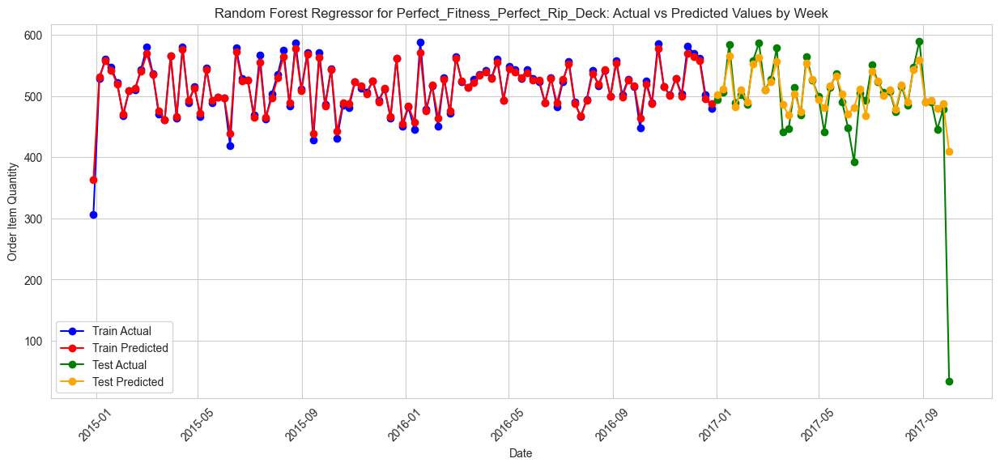

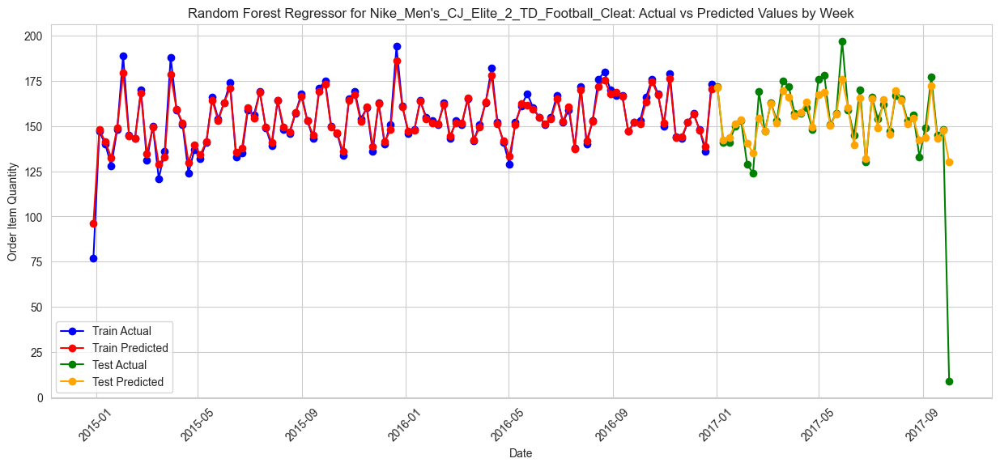

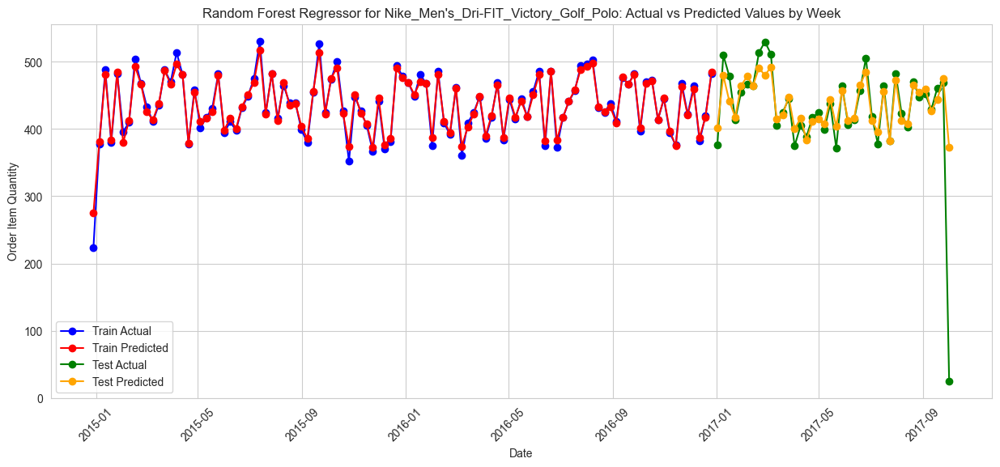

In [49]:
# Create DataFrames with actual and predicted values for train and test datasets
for product in rf_results:
    best_rf = rf_results[product]['cv_best_est']
    # Fit the best model on the entire dataset
    #X_train_reg = regression_data[product]["X_train"]
    X_train = filtered_data_dict[product]["X_train"]
    y_train_reg = regression_data[product]["y_train"]
    X_test = filtered_data_dict[product]["X_test"]
    y_test_reg = regression_data[product]["y_test"]
    rf_train_preds = rf_results[product]["rf_train_preds"]
    rf_test_preds = rf_results[product]["rf_test_preds"]
    train_df_results = pd.DataFrame({'YEAR_WEEK': X_train['YEAR_WEEK'], 'Actual': y_train_reg["Order Item Quantity"], 'Predicted': rf_train_preds})
    test_df_results = pd.DataFrame({'YEAR_WEEK': X_test['YEAR_WEEK'], 'Actual': y_test_reg["Order Item Quantity"], 'Predicted': rf_test_preds})
    plot_prediction_results(train_df_results, test_df_results, "Random Forest Regressor", "_".join(product.split()))

# Fully Connected Neural Network

In [50]:
# Define the neural network model
def create_fcnn_model(input_shape):
    model = tf.keras.Sequential([
        layers.Dense(64, activation='relu', input_shape=input_shape),
        layers.Dense(32, activation='relu'),
        layers.Dense(1)  # Output layer with single neuron for regression
    ])
    
    # Compile the model
    model.compile(optimizer='adam', loss='mean_squared_error', metrics=['mean_absolute_error', 'mean_squared_error'])
    
    return model

In [51]:
def plot_loss(train_loss, val_loss, model_name, prod_name):
    # Plot training history
    plt.plot(train_loss, label='Train Loss')
    plt.plot(val_loss, label='Test Loss')
    plt.title(f'{prod_name}: Train and Validation Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()
    plt.savefig(os.path.join(output_path, prod_name, f'{model_name}.png'))
    plt.show()

In [52]:
fcnn_results = {}
for product in regression_data:
    print(f"{product}")
    X_train_fcnn = regression_data[product]["X_train"]
    y_train_fcnn = regression_data[product]["y_train"]
    # Get input shape (number of features)
    input_shape = X_train_fcnn.shape[1:]
    # Create the model
    model = create_fcnn_model(input_shape)
    # Display model summary
    model.summary()
    # Train the model
    history = model.fit(X_train_fcnn, y_train_fcnn, epochs=100, batch_size=32, validation_split=0.2, verbose=1)
    fcnn_results[product] = {"train_loss": history.history['loss'], "val_loss": history.history['val_loss'], "model": model}
    model.save(os.path.join(output_path, "_".join(product.split()), "FCNN.h5"))
    print("\n")

Perfect Fitness Perfect Rip Deck


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense (Dense)                        │ (None, 64)                  │             576 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 32)                  │           2,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 1)                   │              33 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 2,689 (10.50 KB)

 Trainable params: 2,689 (10.50 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 2s 91ms/step - loss: 22871506.0000 - mean_absolute_error: 4732.9565 - mean_squared_error: 22871506.0000 - val_loss: 9755438.0000 - val_mean_absolute_error: 3116.3086 - val_mean_squared_error: 9755438.0000
Epoch 2/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 7307746.0000 - mean_absolute_error: 2661.8652 - mean_squared_error: 7307746.0000 - val_loss: 1521441.3750 - val_mean_absolute_error: 1228.4142 - val_mean_squared_error: 1521441.3750
Epoch 3/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 897956.1875 - mean_absolute_error: 855.9077 - mean_squared_error: 897956.1875 - val_loss: 182183.8750 - val_mean_absolute_error: 419.3930 - val_mean_squared_error: 182183.8750
Epoch 4/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 497359.0312 - mean_absolute_error: 644.6580 - mean_squared_error: 497359.0312 - val_loss: 1949597.5000 - val_mean_absolute_error: 1392.2389 - val_mean_squared_error: 1949597.5000
Epoch 5/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/st



Nike Men's CJ Elite 2 TD Football Cleat


Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3 (Dense)                      │ (None, 64)                  │             576 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4 (Dense)                      │ (None, 32)                  │           2,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5 (Dense)                      │ (None, 1)                   │              33 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 2,689 (10.50 KB)

 Trainable params: 2,689 (10.50 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 86ms/step - loss: 223389.8906 - mean_absolute_error: 418.6100 - mean_squared_error: 223389.8906 - val_loss: 177136.6875 - val_mean_absolute_error: 416.7984 - val_mean_squared_error: 177136.6875
Epoch 2/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 139606.3438 - mean_absolute_error: 369.1582 - mean_squared_error: 139606.3438 - val_loss: 18993.5469 - val_mean_absolute_error: 131.4749 - val_mean_squared_error: 18993.5469
Epoch 3/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 12025.8477 - mean_absolute_error: 99.3705 - mean_squared_error: 12025.8477 - val_loss: 59261.4102 - val_mean_absolute_error: 241.2631 - val_mean_squared_error: 59261.4102
Epoch 4/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 59704.9844 - mean_absolute_error: 240.8817 - mean_squared_error: 59704.9844 - val_loss: 14155.9688 - val_mean_absolute_error: 114.4608 - val_mean_squared_error: 14155.9688
Epoch 5/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 10091.1865 - mean



Nike Men's Dri-FIT Victory Golf Polo


Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6 (Dense)                      │ (None, 64)                  │             576 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7 (Dense)                      │ (None, 32)                  │           2,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_8 (Dense)                      │ (None, 1)                   │              33 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 2,689 (10.50 KB)

 Trainable params: 2,689 (10.50 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 104ms/step - loss: 4952419.5000 - mean_absolute_error: 2165.8982 - mean_squared_error: 4952419.5000 - val_loss: 711569.6250 - val_mean_absolute_error: 828.3454 - val_mean_squared_error: 711569.6250
Epoch 2/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 472222.8750 - mean_absolute_error: 599.2043 - mean_squared_error: 472222.8750 - val_loss: 158990.3906 - val_mean_absolute_error: 392.8051 - val_mean_squared_error: 158990.3906
Epoch 3/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 294353.8750 - mean_absolute_error: 514.1601 - mean_squared_error: 294353.8750 - val_loss: 842503.0625 - val_mean_absolute_error: 914.9950 - val_mean_squared_error: 842503.0625
Epoch 4/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 852205.0000 - mean_absolute_error: 917.9993 - mean_squared_error: 852205.0000 - val_loss: 673064.5625 - val_mean_absolute_error: 817.8228 - val_mean_squared_error: 673064.5625
Epoch 5/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 55

Fully Connected Neural Network Model Performance
Perfect Fitness Perfect Rip Deck


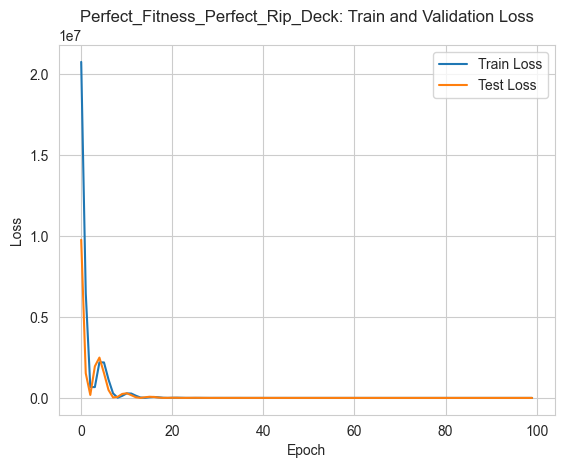

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 609us/step - loss: 552.6907 - mean_absolute_error: 18.4782 - mean_squared_error: 552.6907
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
	Train MAE: 17.985015869140625
	Train MSE: 521.8265493611406
	Train RMSE: 22.843523138105045
	Test MAE: 22.686685371398926
	Test MSE: 958.9123994656271
	Test RMSE: 30.966310717707834


Nike Men's CJ Elite 2 TD Football Cleat


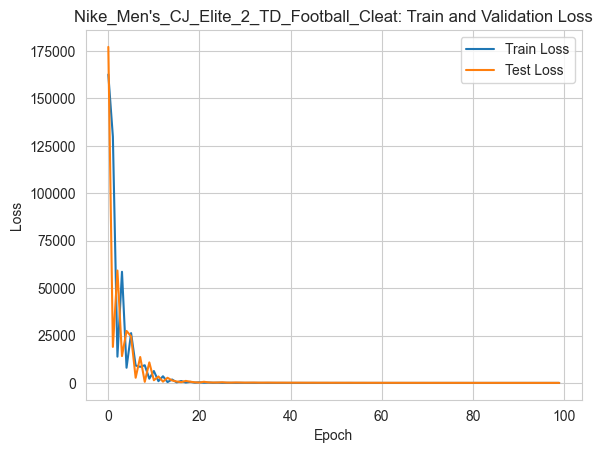

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 5.8274 - mean_absolute_error: 1.2622 - mean_squared_error: 5.8274 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 0s/step 
	Train MAE: 2.024336460658482
	Train MSE: 9.006050784280523
	Train RMSE: 3.0010082946037526
	Test MAE: 2.4954333305358887
	Test MSE: 19.754871185023877
	Test RMSE: 4.444645226002169


Nike Men's Dri-FIT Victory Golf Polo


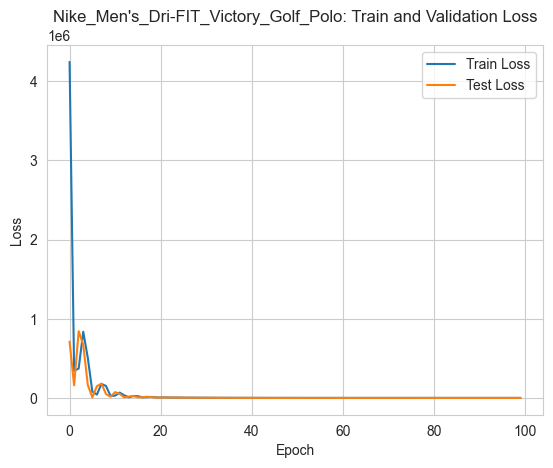

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 161.4819 - mean_absolute_error: 8.7512 - mean_squared_error: 161.4819


1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/stepWARNING:tensorflow:5 out of the last 13 calls to <function TensorFlowTrainer.make_predict_function.<locals>.one_step_on_data_distributed at 0x000002A0F18C85E0> triggered tf.function retracing. Tracing is expensive and the excessive number of tracings could be due to (1) creating @tf.function repeatedly in a loop, (2) passing tensors with different shapes, (3) passing Python objects instead of tensors. For (1), please define your @tf.function outside of the loop. For (2), @tf.function has reduce_retracing=True option that can avoid unnecessary retracing. For (3), please refer to https://www.tensorflow.org/guide/function#controlling_retracing and https://www.tensorflow.org/api_docs/python/tf/function for  more details.


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 557us/step
	Train MAE: 9.098097301664806
	Train MSE: 186.9346062456945
	Train RMSE: 13.67240308964355
	Test MAE: 6.797879028320312
	Test MSE: 73.17546289153397
	Test RMSE: 8.554265771621429




In [54]:
print(f"Fully Connected Neural Network Model Performance")
for product in fcnn_results:
    print(f"{product}")
    # loss curve
    plot_loss(fcnn_results[product]["train_loss"], fcnn_results[product]["val_loss"], "fcnn", "_".join(product.split()))
    
    best_fcnn = fcnn_results[product]['model']
    # Fit the best model on the entire dataset
    X_train_fcnn = regression_data[product]["X_train"]
    y_train_fcnn = regression_data[product]["y_train"]
    X_test_fcnn = regression_data[product]["X_test"]
    y_test_fcnn = regression_data[product]["y_test"]
    best_fcnn.fit(X_train_fcnn, y_train_fcnn)
    # train predictions
    fcnn_train_preds = best_fcnn.predict(X_train_fcnn)
    # test predictions
    fcnn_test_preds = best_fcnn.predict(X_test_fcnn)
    fcnn_results[product].update({"fcnn_train_preds": fcnn_train_preds, "fcnn_test_preds": fcnn_test_preds})

    # evaluate
    mae_train, mse_train, rmse_train = evaluate_model(y_train_fcnn["Order Item Quantity"], fcnn_train_preds)
    mae_test, mse_test, rmse_test = evaluate_model(y_test_fcnn["Order Item Quantity"], fcnn_test_preds)
    
    print(f"\tTrain MAE: {mae_train}")
    print(f"\tTrain MSE: {mse_train}")
    print(f"\tTrain RMSE: {rmse_train}")
    
    print(f"\tTest MAE: {mae_test}")
    print(f"\tTest MSE: {mse_test}")
    print(f"\tTest RMSE: {rmse_test}")

    # prepare results
    fcnn_train_output = X_train_fcnn.copy()
    fcnn_train_output["Order_Item_Quantity_True"] = y_train_fcnn["Order Item Quantity"].tolist()
    fcnn_train_output["Order_Item_Quantity_Predicted"] = fcnn_train_preds
    fcnn_test_output = X_test_fcnn.copy()
    fcnn_test_output["Order_Item_Quantity_True"] = y_test_fcnn["Order Item Quantity"].tolist()
    fcnn_test_output["Order_Item_Quantity_Predicted"] = fcnn_test_preds
    frame_combined = pd.concat([fcnn_train_output, fcnn_test_output], ignore_index=True)
    frame_combined.to_excel(os.path.join(output_path, "_".join(product.split()), "fully_connected_nn_results.xlsx"))

    print("\n")

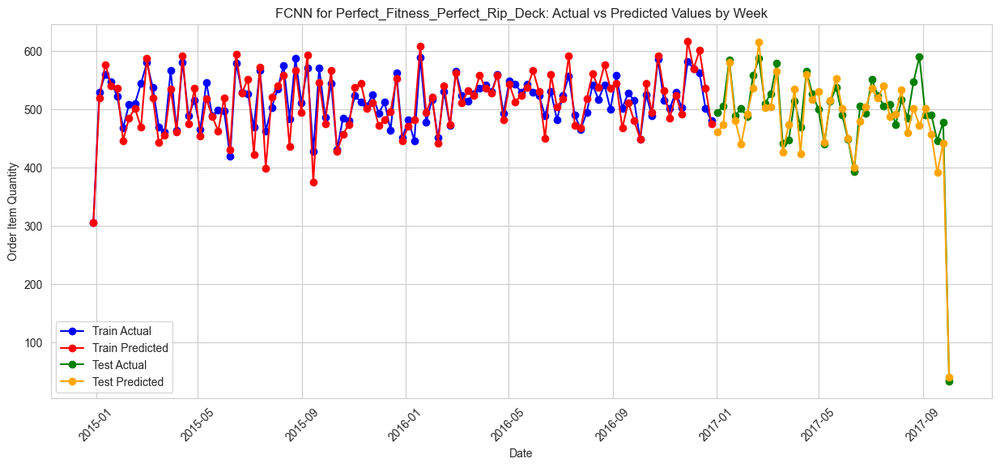

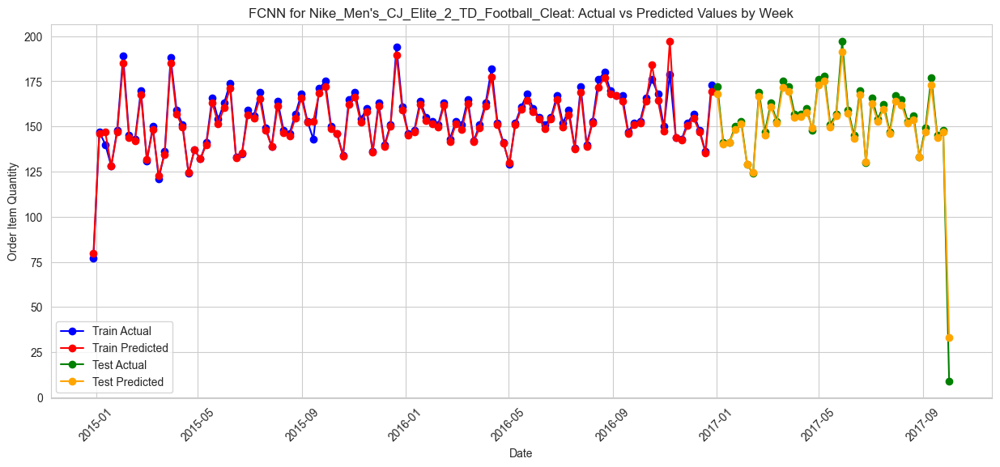

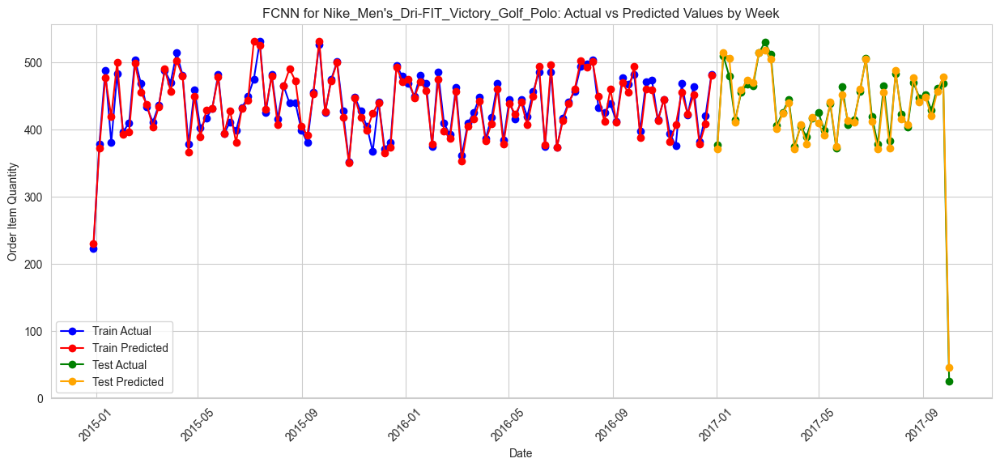

In [55]:
# Create DataFrames with actual and predicted values for train and test datasets
for product in fcnn_results:
    X_train_fcnn = filtered_data_dict[product]["X_train"]
    y_train_fcnn = regression_data[product]["y_train"]
    X_test_fcnn = filtered_data_dict[product]["X_test"]
    y_test_fcnn = regression_data[product]["y_test"]
    fcnn_train_preds = fcnn_results[product]["fcnn_train_preds"]
    fcnn_test_preds = fcnn_results[product]["fcnn_test_preds"]
    train_df_results = pd.DataFrame({'YEAR_WEEK': X_train_fcnn['YEAR_WEEK'], 'Actual': y_train_fcnn["Order Item Quantity"], 'Predicted': fcnn_train_preds.flatten()})
    test_df_results = pd.DataFrame({'YEAR_WEEK': X_test_fcnn['YEAR_WEEK'], 'Actual': y_test_fcnn["Order Item Quantity"], 'Predicted': fcnn_test_preds.flatten()})
    plot_prediction_results(train_df_results, test_df_results, "FCNN", "_".join(product.split()))

# LSTM

In [56]:
# Define the neural network model
def create_lstm_model(X_train):
    # Define the LSTM model
    model = tf.keras.Sequential([
        layers.LSTM(64, input_shape=(X_train.shape[1], X_train.shape[2])),
        layers.Dense(1)  # Output layer with single neuron for regression
    ])
    
    # Compile the model
    model.compile(optimizer='adam', loss='mean_squared_error', metrics=['mean_absolute_error', 'mean_squared_error'])
    
    return model

In [57]:
lstm_results = {}
for product in regression_data:
    print(f"{product}")
    X_train_lstm = regression_data[product]["X_train"]
    y_train_lstm = regression_data[product]["y_train"]
    X_train_lstm = X_train_lstm.values.reshape((X_train_lstm.values.shape[0], 1, X_train_lstm.values.shape[1]))
    # Create the model
    model = create_lstm_model(X_train_lstm)
    # Display model summary
    model.summary()
    # Train the model
    history = model.fit(X_train_lstm, y_train_lstm, epochs=500, batch_size=32, validation_split=0.2, verbose=1)
    lstm_results[product] = {"train_loss": history.history['loss'], "val_loss": history.history['val_loss'], "model": model}
    model.save(os.path.join(output_path, "_".join(product.split()), "LSTM.h5"))
    print("\n")

Perfect Fitness Perfect Rip Deck


Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ lstm (LSTM)                          │ (None, 64)                  │          18,688 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_9 (Dense)                      │ (None, 1)                   │              65 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 18,753 (73.25 KB)

 Trainable params: 18,753 (73.25 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/500
3/3 ━━━━━━━━━━━━━━━━━━━━ 2s 153ms/step - loss: 261745.8125 - mean_absolute_error: 509.3250 - mean_squared_error: 261745.8125 - val_loss: 275404.5312 - val_mean_absolute_error: 523.6893 - val_mean_squared_error: 275404.5312
Epoch 2/500
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 265719.6562 - mean_absolute_error: 513.1970 - mean_squared_error: 265719.6562 - val_loss: 275332.7188 - val_mean_absolute_error: 523.6216 - val_mean_squared_error: 275332.7188
Epoch 3/500
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 263770.2188 - mean_absolute_error: 511.5364 - mean_squared_error: 263770.2188 - val_loss: 275254.0312 - val_mean_absolute_error: 523.5472 - val_mean_squared_error: 275254.0312
Epoch 4/500
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 264118.7500 - mean_absolute_error: 511.4614 - mean_squared_error: 264118.7500 - val_loss: 275182.4688 - val_mean_absolute_error: 523.4785 - val_mean_squared_error: 275182.4688
Epoch 5/500
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 26330



Nike Men's CJ Elite 2 TD Football Cleat


Model: "sequential_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ lstm_1 (LSTM)                        │ (None, 64)                  │          18,688 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_10 (Dense)                     │ (None, 1)                   │              65 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 18,753 (73.25 KB)

 Trainable params: 18,753 (73.25 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/500
3/3 ━━━━━━━━━━━━━━━━━━━━ 2s 173ms/step - loss: 23489.8750 - mean_absolute_error: 152.4515 - mean_squared_error: 23489.8750 - val_loss: 25754.9609 - val_mean_absolute_error: 159.9600 - val_mean_squared_error: 25754.9609
Epoch 2/500
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 23579.9082 - mean_absolute_error: 152.6399 - mean_squared_error: 23579.9082 - val_loss: 25737.8574 - val_mean_absolute_error: 159.9065 - val_mean_squared_error: 25737.8574
Epoch 3/500
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 23163.2617 - mean_absolute_error: 151.1384 - mean_squared_error: 23163.2617 - val_loss: 25714.5176 - val_mean_absolute_error: 159.8331 - val_mean_squared_error: 25714.5176
Epoch 4/500
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 23590.0508 - mean_absolute_error: 152.7914 - mean_squared_error: 23590.0508 - val_loss: 25698.8594 - val_mean_absolute_error: 159.7837 - val_mean_squared_error: 25698.8594
Epoch 5/500
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 23860.3984 - mean_abs



Nike Men's Dri-FIT Victory Golf Polo


Model: "sequential_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ lstm_2 (LSTM)                        │ (None, 64)                  │          18,688 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_11 (Dense)                     │ (None, 1)                   │              65 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 18,753 (73.25 KB)

 Trainable params: 18,753 (73.25 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/500
3/3 ━━━━━━━━━━━━━━━━━━━━ 3s 211ms/step - loss: 189895.0000 - mean_absolute_error: 432.8796 - mean_squared_error: 189895.0000 - val_loss: 194476.7344 - val_mean_absolute_error: 439.5415 - val_mean_squared_error: 194476.7344
Epoch 2/500
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 192385.1875 - mean_absolute_error: 436.2077 - mean_squared_error: 192385.1875 - val_loss: 194407.8594 - val_mean_absolute_error: 439.4594 - val_mean_squared_error: 194407.8594
Epoch 3/500
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 189210.9531 - mean_absolute_error: 432.5255 - mean_squared_error: 189210.9531 - val_loss: 194355.2812 - val_mean_absolute_error: 439.3997 - val_mean_squared_error: 194355.2812
Epoch 4/500
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 188673.5312 - mean_absolute_error: 431.2917 - mean_squared_error: 188673.5312 - val_loss: 194306.0625 - val_mean_absolute_error: 439.3443 - val_mean_squared_error: 194306.0625
Epoch 5/500
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 19120

LSTM Model Performance
Perfect Fitness Perfect Rip Deck


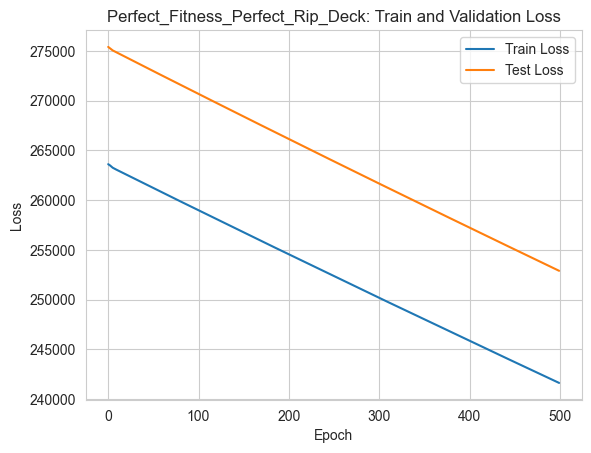

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 243795.4219 - mean_absolute_error: 491.6917 - mean_squared_error: 243795.4219 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 0s/step  
	Train MAE: 491.80253063383554
	Train MSE: 243793.89476142754
	Train RMSE: 493.7548934050452
	Test MAE: 471.8585290431976
	Test MSE: 229912.3489965924
	Test RMSE: 479.49176113525914


Nike Men's CJ Elite 2 TD Football Cleat


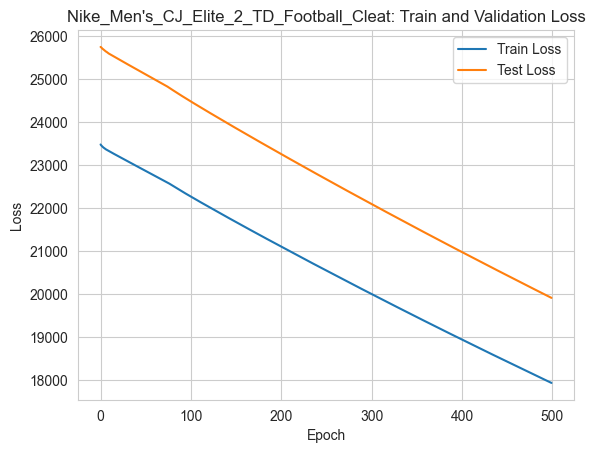

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 18586.4316 - mean_absolute_error: 135.4336 - mean_squared_error: 18586.4316
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 0s/step  
	Train MAE: 134.33768395923434
	Train MSE: 18310.60371701865
	Train RMSE: 135.31667937478605
	Test MAE: 133.7114531993866
	Test MSE: 18499.048738581485
	Test RMSE: 136.01120813587931


Nike Men's Dri-FIT Victory Golf Polo


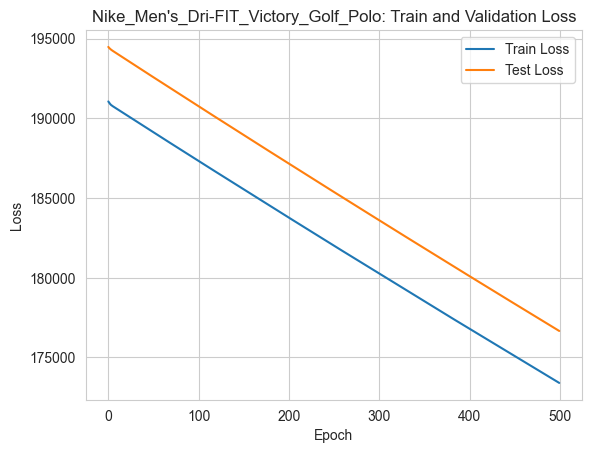

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 174579.4062 - mean_absolute_error: 415.3748 - mean_squared_error: 174579.4062 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 0s/step 
	Train MAE: 414.5565804254441
	Train MSE: 173988.85324932114
	Train RMSE: 417.1197109335894
	Test MAE: 408.1046771287918
	Test MSE: 172294.68929548748
	Test RMSE: 415.0839545146108




In [58]:
print(f"LSTM Model Performance")
for product in lstm_results:
    print(f"{product}")
    # loss curve
    plot_loss(lstm_results[product]["train_loss"], lstm_results[product]["val_loss"], "lstm", "_".join(product.split()))
    
    best_lstm = lstm_results[product]['model']
    # Fit the best model on the entire dataset
    X_train_df = regression_data[product]["X_train"]
    X_train_lstm = X_train_df.values.reshape((X_train_df.values.shape[0], 1, X_train_df.values.shape[1]))
    y_train_lstm = regression_data[product]["y_train"]
    X_test_df = regression_data[product]["X_test"]
    X_test_lstm = X_test_df.values.reshape((X_test_df.values.shape[0], 1, X_test_df.values.shape[1]))
    y_test_lstm = regression_data[product]["y_test"]
    best_lstm.fit(X_train_lstm, y_train_lstm)
    # train predictions
    lstm_train_preds = best_lstm.predict(X_train_lstm)
    # test predictions
    lstm_test_preds = best_lstm.predict(X_test_lstm)
    lstm_results[product].update({"lstm_train_preds": lstm_train_preds, "lstm_test_preds": lstm_test_preds})

    # evaluate
    mae_train, mse_train, rmse_train = evaluate_model(y_train_lstm["Order Item Quantity"], lstm_train_preds)
    mae_test, mse_test, rmse_test = evaluate_model(y_test_lstm["Order Item Quantity"], lstm_test_preds)
    
    print(f"\tTrain MAE: {mae_train}")
    print(f"\tTrain MSE: {mse_train}")
    print(f"\tTrain RMSE: {rmse_train}")
    
    print(f"\tTest MAE: {mae_test}")
    print(f"\tTest MSE: {mse_test}")
    print(f"\tTest RMSE: {rmse_test}")

    # prepare results
    lstm_train_output = X_train_df.copy()
    lstm_train_output["Order_Item_Quantity_True"] = y_train_lstm["Order Item Quantity"].tolist()
    lstm_train_output["Order_Item_Quantity_Predicted"] = lstm_train_preds.flatten()
    lstm_test_output = X_test_df.copy()
    lstm_test_output["Order_Item_Quantity_True"] = y_test_lstm["Order Item Quantity"].tolist()
    lstm_test_output["Order_Item_Quantity_Predicted"] = lstm_test_preds.flatten()
    frame_combined = pd.concat([lstm_train_output, lstm_test_output], ignore_index=True)
    frame_combined.to_excel(os.path.join(output_path, "_".join(product.split()), "lstm_results.xlsx"))

    print("\n")

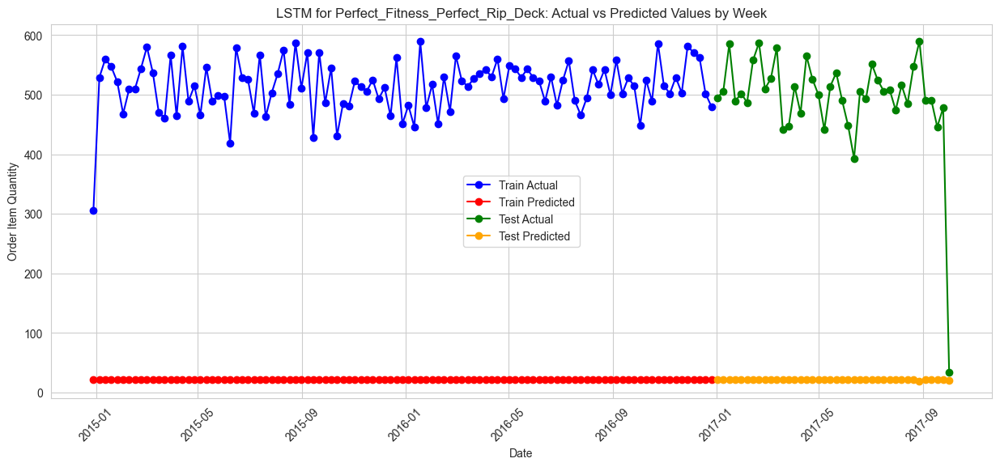

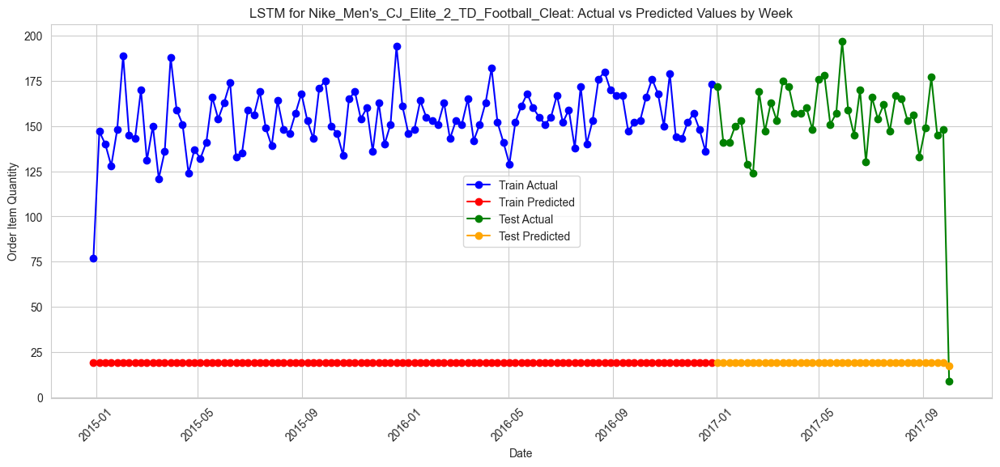

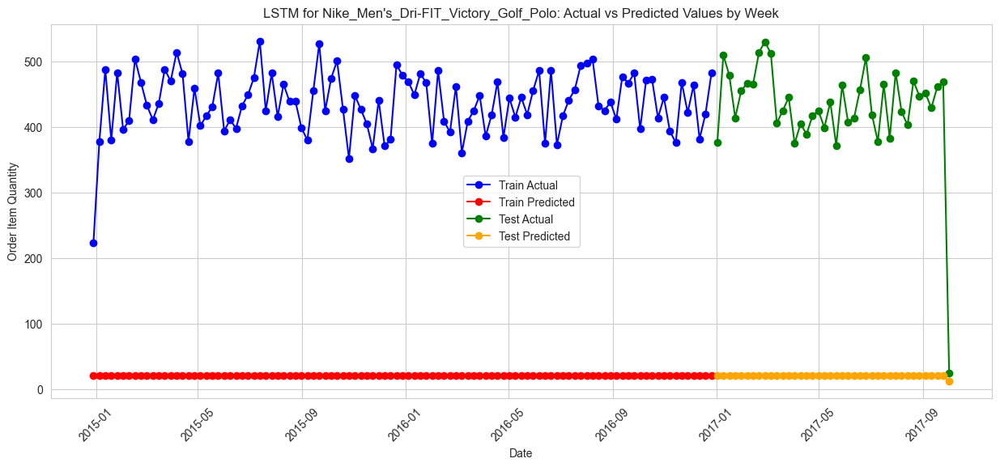

In [59]:
# Create DataFrames with actual and predicted values for train and test datasets
for product in lstm_results:
    X_train_lstm = filtered_data_dict[product]["X_train"]
    y_train_lstm = regression_data[product]["y_train"]
    X_test_lstm = filtered_data_dict[product]["X_test"]
    y_test_lstm = regression_data[product]["y_test"]
    lstm_train_preds = lstm_results[product]["lstm_train_preds"]
    lstm_test_preds = lstm_results[product]["lstm_test_preds"]
    train_df_results = pd.DataFrame({'YEAR_WEEK': X_train_lstm['YEAR_WEEK'], 'Actual': y_train_lstm["Order Item Quantity"], 'Predicted': lstm_train_preds.flatten()})
    test_df_results = pd.DataFrame({'YEAR_WEEK': X_test_lstm['YEAR_WEEK'], 'Actual': y_test_lstm["Order Item Quantity"], 'Predicted': lstm_test_preds.flatten()})
    plot_prediction_results(train_df_results, test_df_results, "LSTM", "_".join(product.split()))

# Prophet

In [60]:
from prophet import Prophet
from prophet.diagnostics import cross_validation
from prophet.diagnostics import performance_metrics
from prophet.plot import plot_cross_validation_metric
from sklearn.model_selection import ParameterGrid
from itertools import product

In [61]:
prophet_data_dict = {}
for product in filtered_data_dict:
    # train
    X_train_ph = filtered_data_dict[product]["X_train"]
    X_train_ph = X_train_ph[['YEAR_WEEK']]
    X_train_ph['YEAR_WEEK'] = X_train_ph['YEAR_WEEK'].apply(lambda row: row.split("/")[0])
    y_train_ph = regression_data[product]["y_train"]
    train_ph = pd.concat([X_train_ph, y_train_ph], axis=1)
    train_ph.columns = ['ds', 'y']
    train_ph['ds'] = pd.to_datetime(train_ph['ds'])
    # test
    X_test_ph = filtered_data_dict[product]["X_test"]
    X_test_ph = X_test_ph[['YEAR_WEEK']]
    X_test_ph['YEAR_WEEK'] = X_test_ph['YEAR_WEEK'].apply(lambda row: row.split("/")[0])
    y_test_ph = regression_data[product]["y_test"]
    test_ph = pd.concat([X_test_ph, y_test_ph], axis=1)
    test_ph.columns = ['ds', 'y']
    test_ph['ds'] = pd.to_datetime(test_ph['ds'])
    prophet_data_dict[product] = {"train": train_ph, "test": test_ph}

In [ ]:
def prophet_grid_search_cv(prophet_df):
    # Specify hyperparameter values to try
    ph_param_grid = {
        'seasonality_mode': ["additive", 'multiplicative'],
        'seasonality_prior_scale': [1, 5, 10, 20],
        'holidays_prior_scale': [5, 10, 20, 25],
        'changepoint_prior_scale': [0.005, 0.01, 0.05, 0.1]
    }
    
    # Generate all combinations of hyperparameters using ParameterGrid
    param_combinations = ParameterGrid(ph_param_grid)
    # Store results in a dictionary
    results = {}
    print(f"trying all {len(param_combinations)} hyperparameter combinations")
    # Generate all combinations of hyperparameters
    from itertools import product
    param_combinations = list(product(*ph_param_grid.values()))
    
    for params in param_combinations:
        # Create a Prophet instance with current hyperparameter values
        prophet = Prophet(**dict(zip(ph_param_grid.keys(), params)))
    
        # Fit the model
        prophet.fit(prophet_df)
    
        # Perform cross-validation
        df_cv = cross_validation(model=prophet, initial='90 days', period='30 days', horizon='30 days')
    
    
        # Calculate performance metrics
        df_metrics = performance_metrics(df_cv, rolling_window=0)
    
        # Store metrics in the results dictionary
        results[params] = df_metrics['mape'].mean()
    best_hyperparams = min(results, key=results.get)
    best_hyperparams_dict = dict(zip(ph_param_grid.keys(), best_hyperparams))
    return best_hyperparams_dict, df_cv
    
for product in prophet_data_dict:
    prophet_train_data = prophet_data_dict[product]["train"]
    best_hyperparams_dict, df_cv = prophet_grid_search_cv(prophet_train_data)
    prophet_data_dict[product].update({"best_hyperparams_dict": best_hyperparams_dict, "df_cv": df_cv})

trying all 128 hyperparameter combinations


DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:Adding TBB (C:\Users\smith\anaconda3\Lib\site-packages\prophet\stan_model\cmdstan-2.33.1\stan\lib\stan_math\lib\tbb) to PATH
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\pwgxlxqr.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\acbexm91.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=43673', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\pwgxlxqr.json', 'init=C:\\Users\\smi

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\9r4znfon.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\7ig7j2ft.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=99891', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\9r4znfon.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\7ig7j2ft.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_model9vfem8zs\\prophet_model-20240418202705.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:27:05 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\7z01_m3c.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\6j9ctbji.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=61509', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\7z01_m3c.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\6j9ctbji.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modellf4xp53l\\prophet_model-20240418202710.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:27:10 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\_06ri7e5.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\m4_sypn5.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=52406', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\_06ri7e5.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\m4_sypn5.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modelt7ernhwg\\prophet_model-20240418202715.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:27:15 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\6jqoooeo.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\nt7l0rkw.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=16374', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\6jqoooeo.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\nt7l0rkw.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modelni0e9e6p\\prophet_model-20240418202721.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:27:21 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\mw44zige.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\7dh_ymbt.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=58286', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\mw44zige.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\7dh_ymbt.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modeliuqbeicp\\prophet_model-20240418202727.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:27:27 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\ttsuizcv.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\u98ge9qn.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=5044', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\ttsuizcv.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\u98ge9qn.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modelrdfozbbs\\prophet_model-20240418202732.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:27:32 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start p

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\9xjhblw6.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\sv_2xqg8.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=37855', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\9xjhblw6.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\sv_2xqg8.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modelz_qx8fym\\prophet_model-20240418202737.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:27:37 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\x4c199ew.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\9snuft7v.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=11064', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\x4c199ew.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\9snuft7v.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modell5pyoxa9\\prophet_model-20240418202743.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:27:43 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\d8v7fa6a.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\ohu713u6.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=76110', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\d8v7fa6a.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\ohu713u6.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_model4_vitgrr\\prophet_model-20240418202749.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:27:49 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\fbqpk1cs.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\bwo98o_4.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=92161', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\fbqpk1cs.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\bwo98o_4.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_model8byvtwxd\\prophet_model-20240418202754.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:27:54 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\nagxtpds.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\xmetisc1.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=58942', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\nagxtpds.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\xmetisc1.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modelz54ozzc1\\prophet_model-20240418202759.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:27:59 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\8vl63sl8.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\b_uexldq.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=59850', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\8vl63sl8.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\b_uexldq.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_model6eoe9dwd\\prophet_model-20240418202804.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:28:04 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\hi4camkg.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\ck_yy7tt.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=38143', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\hi4camkg.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\ck_yy7tt.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modelogqi6_26\\prophet_model-20240418202810.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:28:10 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\6agsi22f.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\iuifvmfx.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=34400', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\6agsi22f.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\iuifvmfx.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modelf4d011_s\\prophet_model-20240418202815.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:28:15 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\qehudrhq.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\y8x7yagz.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=97064', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\qehudrhq.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\y8x7yagz.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modelmuv1k3wh\\prophet_model-20240418202820.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:28:20 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\1cf5ul3x.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\yfsaf6fy.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=2693', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\1cf5ul3x.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\yfsaf6fy.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modelcql6tc_g\\prophet_model-20240418202826.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:28:26 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start p

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\t8mki2t7.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\lnzdj_gw.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=8814', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\t8mki2t7.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\lnzdj_gw.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modelf2umxxbw\\prophet_model-20240418202832.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:28:32 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start p

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\246pgxjo.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\basdc_zj.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=37792', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\246pgxjo.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\basdc_zj.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_model4b9jmsd5\\prophet_model-20240418202837.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:28:37 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\roybfeex.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\7w2d262p.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=84222', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\roybfeex.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\7w2d262p.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modelc39hyk4j\\prophet_model-20240418202842.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:28:42 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\4gfvd0py.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\ooc6u524.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=84373', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\4gfvd0py.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\ooc6u524.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_model4wz7c92p\\prophet_model-20240418202848.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:28:48 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\he12lfr8.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\7rchpv22.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=56813', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\he12lfr8.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\7rchpv22.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modell_oy9j2i\\prophet_model-20240418202854.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:28:54 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\z0fxni16.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\yyl9r6jm.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=17481', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\z0fxni16.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\yyl9r6jm.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modelletscyk2\\prophet_model-20240418202859.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:28:59 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\36r7twe7.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\ms06hai5.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=22031', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\36r7twe7.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\ms06hai5.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modeld3bp3vat\\prophet_model-20240418202904.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:29:04 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\3hk8opq0.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\_mzy2ml_.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=76128', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\3hk8opq0.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\_mzy2ml_.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modeloravv7p3\\prophet_model-20240418202909.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:29:09 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\1rm45tbf.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\mnkuzrtv.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=65059', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\1rm45tbf.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\mnkuzrtv.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_model7by2p1tk\\prophet_model-20240418202915.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:29:15 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\wwpueop0.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\362b1pkt.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=34656', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\wwpueop0.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\362b1pkt.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modelbcwxiwv8\\prophet_model-20240418202921.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:29:21 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\c4kgevel.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\s1wwxfpz.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=31164', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\c4kgevel.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\s1wwxfpz.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modelmzff82yk\\prophet_model-20240418202925.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:29:25 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\_3t1ud6f.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\7qy852sf.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=32374', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\_3t1ud6f.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\7qy852sf.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modeljpxpo55y\\prophet_model-20240418202931.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:29:31 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\c4tl5nco.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\o06f6l0w.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=60059', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\c4tl5nco.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\o06f6l0w.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modelbqt2pq_0\\prophet_model-20240418202937.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:29:37 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\bzb84r1o.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\pdngkg83.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=40728', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\bzb84r1o.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\pdngkg83.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modelrnol6o5f\\prophet_model-20240418202942.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:29:42 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\77pfpd7g.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\kuc30ftz.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=88576', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\77pfpd7g.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\kuc30ftz.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modellycybqrh\\prophet_model-20240418202947.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:29:47 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\kljv4lns.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\sisbw3x0.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=36412', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\kljv4lns.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\sisbw3x0.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modelcb9pbbit\\prophet_model-20240418202952.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:29:52 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\jzqqd0ax.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\2k0ed2r4.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=39779', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\jzqqd0ax.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\2k0ed2r4.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modelu5xnvldo\\prophet_model-20240418202958.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:29:58 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\wl6zs33o.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\0l9oyz5n.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=5865', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\wl6zs33o.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\0l9oyz5n.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_model7mw65d3b\\prophet_model-20240418203004.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:30:04 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start p

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\gftwpz_s.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\_gq66s3t.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=78559', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\gftwpz_s.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\_gq66s3t.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modeldh6modby\\prophet_model-20240418203008.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:30:08 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\j66kby7b.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\dvz6iyk1.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=94016', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\j66kby7b.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\dvz6iyk1.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_models1tionsz\\prophet_model-20240418203014.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:30:14 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\v6js2dqf.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\d3iviye4.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=62476', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\v6js2dqf.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\d3iviye4.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modele687e0ds\\prophet_model-20240418203020.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:30:20 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\hicq0gbd.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\yx3wc4uw.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=31457', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\hicq0gbd.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\yx3wc4uw.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modelh_0qjy2d\\prophet_model-20240418203025.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:30:25 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\gcguqo7a.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\rge9s80s.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=38934', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\gcguqo7a.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\rge9s80s.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_model9pchnp7v\\prophet_model-20240418203030.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:30:30 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\xc7yvd15.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\93lk5rf4.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=98562', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\xc7yvd15.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\93lk5rf4.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modelrpirzsah\\prophet_model-20240418203035.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:30:35 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\6z3it707.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\4djnosc0.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=85382', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\6z3it707.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\4djnosc0.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modeltfpanlfx\\prophet_model-20240418203042.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:30:42 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\6audtv77.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\mokudiv6.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=67915', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\6audtv77.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\mokudiv6.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_model0j55y4k2\\prophet_model-20240418203047.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:30:47 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\1chi9e_u.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\fya_ep8b.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=24650', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\1chi9e_u.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\fya_ep8b.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modelekmjfwio\\prophet_model-20240418203052.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:30:52 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\vsm2beus.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\e2fg9nxn.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=31691', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\vsm2beus.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\e2fg9nxn.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modell2y9jg53\\prophet_model-20240418203057.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:30:57 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\uwutq5nd.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\aamq2ezy.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=57564', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\uwutq5nd.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\aamq2ezy.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modelty286y10\\prophet_model-20240418203103.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:31:03 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\okpvrqpr.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\z2qb5iic.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=69579', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\okpvrqpr.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\z2qb5iic.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_model79u7haf5\\prophet_model-20240418203108.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:31:08 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\gs51k3j3.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\nwegwqxe.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=71631', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\gs51k3j3.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\nwegwqxe.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modelkpmyy4pe\\prophet_model-20240418203113.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:31:13 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\kghhycix.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\o3n6azlo.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=10158', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\kghhycix.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\o3n6azlo.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modelz832u4qc\\prophet_model-20240418203118.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:31:18 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\xbc4er9v.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\aebe8wnn.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=30536', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\xbc4er9v.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\aebe8wnn.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modelyx6aj1yg\\prophet_model-20240418203125.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:31:25 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\j2385t4u.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\6_boaob3.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=77822', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\j2385t4u.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\6_boaob3.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modelwqt7bncb\\prophet_model-20240418203130.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:31:30 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\rr5hqx7e.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\4rz8t9uz.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=68224', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\rr5hqx7e.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\4rz8t9uz.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_model2ekpoub0\\prophet_model-20240418203134.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:31:34 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\894p_tat.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\n1abfabj.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=64169', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\894p_tat.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\n1abfabj.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modelepg_y6vk\\prophet_model-20240418203140.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:31:40 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\bwj0habj.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\33ujchk9.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=56957', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\bwj0habj.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\33ujchk9.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modelq1z6c1kd\\prophet_model-20240418203146.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:31:46 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\_sbyi4cv.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\c35lxqur.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=30285', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\_sbyi4cv.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\c35lxqur.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modelwxyzwtuz\\prophet_model-20240418203151.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:31:51 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\hs8grcz8.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\tel5c7ax.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=44600', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\hs8grcz8.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\tel5c7ax.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_model1d2b27pw\\prophet_model-20240418203155.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:31:55 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\q5s13te2.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\vjf26ugq.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=63932', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\q5s13te2.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\vjf26ugq.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modelu8xre9ul\\prophet_model-20240418203201.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:32:01 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\09k9cws2.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\_1n544wg.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=85738', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\09k9cws2.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\_1n544wg.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modelksn1q5yc\\prophet_model-20240418203207.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:32:07 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\fsdt8umf.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\zw9qcp0c.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=37467', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\fsdt8umf.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\zw9qcp0c.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modeljymm_2dq\\prophet_model-20240418203212.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:32:12 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\9b41pb52.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\hnuklhs0.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=81710', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\9b41pb52.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\hnuklhs0.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_model15ii6wq6\\prophet_model-20240418203217.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:32:17 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\s5tvb9r2.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\zmxrmhhw.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=8577', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\s5tvb9r2.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\zmxrmhhw.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_model25r6u6sw\\prophet_model-20240418203222.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:32:22 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start p

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\r2u1kgkx.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\za998k79.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=41229', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\r2u1kgkx.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\za998k79.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modelvbaat3jr\\prophet_model-20240418203228.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:32:28 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\cqb1qkrg.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\c0757x0d.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=81852', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\cqb1qkrg.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\c0757x0d.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_model3trks7g1\\prophet_model-20240418203234.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:32:34 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\_2jbpyq_.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\2du0mxmd.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=47320', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\_2jbpyq_.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\2du0mxmd.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modela7d8zcid\\prophet_model-20240418203238.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:32:38 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\phc1lntq.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\7he5mmbt.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=31179', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\phc1lntq.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\7he5mmbt.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_model4wlqiswx\\prophet_model-20240418203244.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:32:44 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\syptth_r.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\dpjspk02.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=14581', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\syptth_r.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\dpjspk02.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_model7qgpihe6\\prophet_model-20240418203250.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:32:50 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\kcn8e9jj.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\xz3emkdv.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=49602', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\kcn8e9jj.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\xz3emkdv.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_model0uawly8k\\prophet_model-20240418203255.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:32:55 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\qg8uo9xh.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\kbnft5zt.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=12839', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\qg8uo9xh.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\kbnft5zt.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modelq54mpxxd\\prophet_model-20240418203259.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:32:59 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\s68ovrci.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\6rhqc1tx.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=59610', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\s68ovrci.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\6rhqc1tx.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modela554e4ao\\prophet_model-20240418203304.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:33:04 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\4klydj8l.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\g0vajpoh.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=67114', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\4klydj8l.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\g0vajpoh.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modelg96uhl63\\prophet_model-20240418203310.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:33:10 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\i34poelb.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\6wl33qt5.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=16491', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\i34poelb.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\6wl33qt5.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modelpsn6zb4l\\prophet_model-20240418203315.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:33:15 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\or9zap74.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\rxy0e4d0.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=42943', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\or9zap74.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\rxy0e4d0.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modelk5lh68gh\\prophet_model-20240418203319.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:33:19 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\8d1m4cvs.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\06mhragz.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=93846', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\8d1m4cvs.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\06mhragz.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_model78gj3uun\\prophet_model-20240418203325.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:33:25 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\v5w92aa0.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\3mavwt1z.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=40553', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\v5w92aa0.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\3mavwt1z.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modeljq7noki5\\prophet_model-20240418203331.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:33:31 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\4rdl243o.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\icggzqxs.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=8230', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\4rdl243o.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\icggzqxs.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modeltwllfqly\\prophet_model-20240418203336.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:33:36 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start p

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\xn17m49p.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\y2366x7d.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=2924', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\xn17m49p.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\y2366x7d.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modelqxg2pg3p\\prophet_model-20240418203340.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:33:40 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start p

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\y5fzqqc4.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\d1qx4r0s.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=13589', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\y5fzqqc4.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\d1qx4r0s.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modelk8qzl0l0\\prophet_model-20240418203345.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:33:45 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\vgj_fol6.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\kcdbrnp2.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=70617', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\vgj_fol6.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\kcdbrnp2.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_model85c_j4_r\\prophet_model-20240418203351.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:33:51 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\rs4ez333.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\vvn6vfwi.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=63287', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\rs4ez333.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\vvn6vfwi.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modely14yarr3\\prophet_model-20240418203356.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:33:56 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\6rqe1_ry.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\h07ydwk6.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=36711', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\6rqe1_ry.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\h07ydwk6.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modelrha8r0n4\\prophet_model-20240418203400.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:34:00 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\xnv5l9oc.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\4ln07wp8.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=42822', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\xnv5l9oc.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\4ln07wp8.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modelay7v___l\\prophet_model-20240418203405.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:34:05 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\_2o1opdm.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\aja67owi.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=27717', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\_2o1opdm.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\aja67owi.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_model9mxx6pmt\\prophet_model-20240418203411.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:34:11 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\pnfszj_m.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\iwhwgn3c.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=63865', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\pnfszj_m.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\iwhwgn3c.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modelbendj6b7\\prophet_model-20240418203416.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:34:16 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\9t7rl_q1.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\k4roe5an.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=75783', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\9t7rl_q1.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\k4roe5an.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modelypsnmllm\\prophet_model-20240418203421.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:34:21 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\_4719g5d.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\s1hqk8sf.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=95363', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\_4719g5d.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\s1hqk8sf.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modelhp22bmfg\\prophet_model-20240418203426.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:34:26 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\oreckczf.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\24zuvgbz.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=30008', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\oreckczf.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\24zuvgbz.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modelod7y2jna\\prophet_model-20240418203432.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:34:32 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\zokeyi8z.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\pod97q9y.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=23105', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\zokeyi8z.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\pod97q9y.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modelwk6vhiaf\\prophet_model-20240418203437.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:34:37 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\dg5j6ryp.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\ro7ma006.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=32520', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\dg5j6ryp.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\ro7ma006.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_model07pkzhne\\prophet_model-20240418203441.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:34:41 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\nwyad_v_.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\ll1wxa_c.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=48270', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\nwyad_v_.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\ll1wxa_c.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modelagr2gl60\\prophet_model-20240418203446.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:34:46 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\hx57f3_i.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\m4vf3hc8.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=50020', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\hx57f3_i.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\m4vf3hc8.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modelzglrblmz\\prophet_model-20240418203452.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:34:52 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\o778bhdn.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\ca_3rjac.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=47820', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\o778bhdn.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\ca_3rjac.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_model5ulo3v_i\\prophet_model-20240418203457.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:34:57 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\xjjbjlg_.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\2131cc9t.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=46269', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\xjjbjlg_.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\2131cc9t.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modelj2u7p7la\\prophet_model-20240418203501.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:35:01 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\779qhif2.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\ggdyqwgw.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=48846', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\779qhif2.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\ggdyqwgw.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modeldu39r3_w\\prophet_model-20240418203507.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:35:07 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\ssjwkwog.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\k0amhnmc.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=66364', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\ssjwkwog.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\k0amhnmc.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_model7ysw3xhq\\prophet_model-20240418203513.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:35:13 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\qp5t3ajp.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\hvppt8u7.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=96553', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\qp5t3ajp.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\hvppt8u7.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modelykeij9o8\\prophet_model-20240418203517.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:35:17 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\je4fy9so.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\1tk8e8x8.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=11729', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\je4fy9so.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\1tk8e8x8.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modelov1er81f\\prophet_model-20240418203522.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:35:22 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\5wge_1l_.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\46qz6ffk.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=91467', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\5wge_1l_.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\46qz6ffk.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modelxq1czsk4\\prophet_model-20240418203527.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:35:27 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\gl72f2ov.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\t82d0_dy.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=21106', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\gl72f2ov.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\t82d0_dy.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modelszbgr0y0\\prophet_model-20240418203533.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:35:33 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\1dli8u2o.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\2n6b19ag.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=21548', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\1dli8u2o.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\2n6b19ag.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_model1b7efp6w\\prophet_model-20240418203537.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:35:37 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\fu027qbv.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\752110ms.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=48073', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\fu027qbv.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\752110ms.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modelopvjti_4\\prophet_model-20240418203542.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:35:42 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\6q7p0zmd.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\dhrbjgf7.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=45928', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\6q7p0zmd.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\dhrbjgf7.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modelb4geag35\\prophet_model-20240418203547.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:35:47 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\9jx17ccd.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\ups_no95.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=85496', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\9jx17ccd.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\ups_no95.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modelodwhd7bw\\prophet_model-20240418203552.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:35:52 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\c5nfjhoo.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\rerf6bly.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=67327', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\c5nfjhoo.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\rerf6bly.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modelqnzraiqx\\prophet_model-20240418203557.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:35:57 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\dsmcniqq.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\gxhap5sz.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=54584', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\dsmcniqq.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\gxhap5sz.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modeluiffe02z\\prophet_model-20240418203602.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:36:02 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\1lc64iqg.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\xc6w_64z.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=94094', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\1lc64iqg.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\xc6w_64z.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modeliw8lturc\\prophet_model-20240418203607.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:36:07 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\nffj4tso.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\nv3a_xj2.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=84239', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\nffj4tso.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\nv3a_xj2.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_model6ij75zg_\\prophet_model-20240418203612.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:36:12 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\ul28v7_v.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\ebhpklwp.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=48326', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\ul28v7_v.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\ebhpklwp.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_model5c3mzuv0\\prophet_model-20240418203617.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:36:17 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\aywtbx58.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\4y39ng_o.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=61706', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\aywtbx58.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\4y39ng_o.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modelvmfn599c\\prophet_model-20240418203622.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:36:22 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\gvlqcsu4.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\1g0f9i5w.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=36399', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\gvlqcsu4.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\1g0f9i5w.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modelg3900ojw\\prophet_model-20240418203627.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:36:27 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\b2i9i5fo.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\l34qo5kx.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=49227', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\b2i9i5fo.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\l34qo5kx.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modelyolkuz11\\prophet_model-20240418203633.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:36:33 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\6xrfox38.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\przg_dpt.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=70421', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\6xrfox38.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\przg_dpt.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_model_yfezbf1\\prophet_model-20240418203638.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:36:38 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\pwddthw_.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\v1ytfpw1.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=20964', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\pwddthw_.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\v1ytfpw1.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_model3xmb3d4k\\prophet_model-20240418203643.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:36:43 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\v7s8pxjl.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\irpaif8d.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=18857', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\v7s8pxjl.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\irpaif8d.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modelrnnb68kl\\prophet_model-20240418203648.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:36:48 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\zrjrs_x0.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\yq3bqcqf.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=72132', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\zrjrs_x0.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\yq3bqcqf.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modelmzvwwmo_\\prophet_model-20240418203654.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:36:54 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\xpqqk9a8.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\jkxs_id_.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=71698', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\xpqqk9a8.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\jkxs_id_.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modelf_7i976t\\prophet_model-20240418203659.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:36:59 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\uwrqrjy4.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\5nqii0_k.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=92151', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\uwrqrjy4.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\5nqii0_k.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modeld8_szo8_\\prophet_model-20240418203704.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:37:04 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\nxs0m09k.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\9_m5pw64.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=88231', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\nxs0m09k.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\9_m5pw64.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_model3s1j4njc\\prophet_model-20240418203709.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:37:09 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\26i291ya.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\9g8tglcn.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=73095', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\26i291ya.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\9g8tglcn.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modelyqhn9hf5\\prophet_model-20240418203715.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:37:15 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\4b2u48n3.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\itpob039.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=98552', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\4b2u48n3.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\itpob039.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_model0lvo9aa6\\prophet_model-20240418203720.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:37:20 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\cyy32vay.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\fpe_j250.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=48860', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\cyy32vay.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\fpe_j250.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modelenihk9pn\\prophet_model-20240418203724.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:37:24 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\ar6ni9sx.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\h_x9y5xj.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=72541', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\ar6ni9sx.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\h_x9y5xj.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modelom37xguz\\prophet_model-20240418203730.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:37:30 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\pu_m5uq5.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\mo6tm7jg.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=39946', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\pu_m5uq5.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\mo6tm7jg.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_model45e3pr6k\\prophet_model-20240418203736.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:37:36 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\gf8yxj16.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\ir7c8h20.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=3973', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\gf8yxj16.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\ir7c8h20.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modelp5l2xrzt\\prophet_model-20240418203741.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:37:41 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start p

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\d0xrmx2p.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\mygm87mp.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=76920', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\d0xrmx2p.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\mygm87mp.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modely5pdpbi4\\prophet_model-20240418203745.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:37:45 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\g74gsg29.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\1d7374ga.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=17014', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\g74gsg29.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\1d7374ga.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modeli6_5e829\\prophet_model-20240418203750.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:37:50 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\lh1pmkk5.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\ymvyx8g7.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=19708', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\lh1pmkk5.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\ymvyx8g7.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modelxn3yhwa9\\prophet_model-20240418203756.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:37:56 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\9ez4zpth.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\5d22l7z_.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=31137', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\9ez4zpth.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\5d22l7z_.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_model7kq8886m\\prophet_model-20240418203801.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:38:01 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\5kfdvxyu.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\2e_kfdd2.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=52116', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\5kfdvxyu.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\2e_kfdd2.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_model5nhxv9qj\\prophet_model-20240418203806.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:38:06 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\zdclybiw.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\8nznij3r.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=48860', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\zdclybiw.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\8nznij3r.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modelij1d1mfd\\prophet_model-20240418203811.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:38:11 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

trying all 128 hyperparameter combinations


  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\rlmjjcg9.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\k82zzqf0.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=16592', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\rlmjjcg9.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\k82zzqf0.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modelau887rdo\\prophet_model-20240418203817.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:38:17 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\uj6_nre5.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\2o_w6dbx.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=19488', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\uj6_nre5.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\2o_w6dbx.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modeldmu9lx16\\prophet_model-20240418203822.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:38:22 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\xf1n84gz.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\5avgemkr.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=7649', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\xf1n84gz.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\5avgemkr.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_model66xun5qo\\prophet_model-20240418203827.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:38:27 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start p

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\aq00h12g.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\eddjkpof.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=30808', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\aq00h12g.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\eddjkpof.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modelsxxzj17f\\prophet_model-20240418203832.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:38:32 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\euh2bvh1.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\t810x4cj.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=14853', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\euh2bvh1.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\t810x4cj.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modelxjjoxfto\\prophet_model-20240418203838.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:38:38 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\_eoohtkl.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\u635r1qz.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=29349', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\_eoohtkl.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\u635r1qz.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_model301wk8hu\\prophet_model-20240418203843.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:38:43 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\hia_4fra.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\gl6yiieu.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=64525', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\hia_4fra.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\gl6yiieu.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modeln00q_di2\\prophet_model-20240418203848.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:38:48 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\7b04962n.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\n9rxapd3.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=96015', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\7b04962n.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\n9rxapd3.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_model6oq5m0ke\\prophet_model-20240418203854.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:38:54 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\rnr_vpkv.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\vwyn9yrg.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=40351', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\rnr_vpkv.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\vwyn9yrg.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modelr56p3esf\\prophet_model-20240418203900.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:39:00 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\1suv3tzw.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\ykanecl0.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=1047', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\1suv3tzw.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\ykanecl0.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modelo54iyh_e\\prophet_model-20240418203905.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:39:05 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start p

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\chsu10m5.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\x65z7bdr.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=85001', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\chsu10m5.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\x65z7bdr.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modeld_rhchdu\\prophet_model-20240418203910.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:39:10 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\o69xns25.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\_2c0cadi.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=17998', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\o69xns25.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\_2c0cadi.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modelej0b901v\\prophet_model-20240418203915.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:39:15 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\ekzbm7vn.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\y2vm6ph8.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=13657', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\ekzbm7vn.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\y2vm6ph8.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_model5rihoy94\\prophet_model-20240418203922.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:39:22 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\044mz2oz.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\k_7lst91.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=10217', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\044mz2oz.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\k_7lst91.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_model0ffg5nma\\prophet_model-20240418203927.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:39:27 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\ukklhg33.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\vy_isvb0.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=96316', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\ukklhg33.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\vy_isvb0.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modelz1w74msw\\prophet_model-20240418203931.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:39:31 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\r7lfsz_p.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\ujuh1598.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=30025', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\r7lfsz_p.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\ujuh1598.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modelizh679p5\\prophet_model-20240418203937.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:39:37 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\w6dxuogu.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\ia9d6654.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=83300', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\w6dxuogu.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\ia9d6654.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modelp8gkebt3\\prophet_model-20240418203943.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:39:43 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\20ow44__.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\1u_6c93b.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=50677', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\20ow44__.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\1u_6c93b.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modelsktrf3wt\\prophet_model-20240418203948.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:39:48 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\9tnboj23.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\0jqc96gy.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=12283', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\9tnboj23.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\0jqc96gy.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_model715323s7\\prophet_model-20240418203953.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:39:53 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\4xwucq_s.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\wb77850f.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=9840', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\4xwucq_s.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\wb77850f.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modelpt3lut71\\prophet_model-20240418203959.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:39:59 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start p

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\dxvho2ct.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\ejq9irkf.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=6556', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\dxvho2ct.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\ejq9irkf.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modelo1wybv_6\\prophet_model-20240418204005.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:40:05 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start p

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\gbvc0rv6.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\ibnycw9x.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=31470', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\gbvc0rv6.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\ibnycw9x.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modelhy4a3msj\\prophet_model-20240418204010.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:40:10 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\9uc3kbwm.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\l31wmupw.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=80950', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\9uc3kbwm.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\l31wmupw.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modeldxgkj9s5\\prophet_model-20240418204015.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:40:15 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\za4qi7jh.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\8zmj6wkx.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=52471', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\za4qi7jh.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\8zmj6wkx.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modelu5ihbev6\\prophet_model-20240418204021.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:40:21 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\sy7jdsdb.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\tc848jdw.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=9642', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\sy7jdsdb.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\tc848jdw.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_model8s0pp44t\\prophet_model-20240418204028.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:40:28 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start p

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\han_tcqe.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\6_e5w_x5.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=68426', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\han_tcqe.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\6_e5w_x5.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_model207tg3mq\\prophet_model-20240418204033.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:40:33 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\flgu4kux.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\8v0hbbdu.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=53725', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\flgu4kux.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\8v0hbbdu.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modelllpalyq0\\prophet_model-20240418204038.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:40:38 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\gst7spwe.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\7_6artv2.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=30261', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\gst7spwe.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\7_6artv2.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_model551dsjg0\\prophet_model-20240418204044.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:40:44 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\isdfzaop.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\2su0xl9a.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=43529', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\isdfzaop.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\2su0xl9a.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modelx2k5gsbj\\prophet_model-20240418204051.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:40:51 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\6d0oz61t.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\baeqhrtt.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=44763', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\6d0oz61t.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\baeqhrtt.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_model6gdmpn1u\\prophet_model-20240418204056.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:40:56 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\xq4awrtm.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\hb_v7_6o.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=47382', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\xq4awrtm.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\hb_v7_6o.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_model1t00z5nb\\prophet_model-20240418204100.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:41:00 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\99vlmbaj.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\s9spsj6i.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=60162', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\99vlmbaj.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\s9spsj6i.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modelegk6cyrq\\prophet_model-20240418204106.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:41:06 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\zojcu1_8.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\p5et52x5.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=94439', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\zojcu1_8.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\p5et52x5.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_model0m6ma52v\\prophet_model-20240418204112.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:41:12 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\zy553muz.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\omshmicq.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=87018', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\zy553muz.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\omshmicq.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_model1ffodr9p\\prophet_model-20240418204118.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:41:18 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\5ql7b_98.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\rxglr8hq.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=41045', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\5ql7b_98.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\rxglr8hq.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modeli167m1u0\\prophet_model-20240418204123.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:41:23 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\woz_gk09.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\ams9hzn2.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=28308', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\woz_gk09.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\ams9hzn2.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modelbukiyfni\\prophet_model-20240418204129.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:41:29 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\ge5aw3pn.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\wskt30sf.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=5013', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\ge5aw3pn.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\wskt30sf.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_model1hr1xv0n\\prophet_model-20240418204135.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:41:35 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start p

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\fyw_2v69.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\oghccndg.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=95841', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\fyw_2v69.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\oghccndg.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modeljrmz63mf\\prophet_model-20240418204140.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:41:40 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\6o09ik1u.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\d7uy2d18.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=40627', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\6o09ik1u.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\d7uy2d18.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modelwkb25otk\\prophet_model-20240418204145.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:41:45 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\ht00p_e4.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\dnuuljad.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=21701', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\ht00p_e4.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\dnuuljad.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_model40c4ykuc\\prophet_model-20240418204151.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:41:51 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\jsidbnxg.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\6cxhbb46.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=84200', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\jsidbnxg.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\6cxhbb46.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modellp0l30n3\\prophet_model-20240418204157.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:41:57 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\phafitdd.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\cx23z_wa.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=8650', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\phafitdd.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\cx23z_wa.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modeln0y8k8p8\\prophet_model-20240418204202.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:42:02 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start p

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\zyl76rvu.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\fh4y6u1p.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=86861', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\zyl76rvu.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\fh4y6u1p.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modelohji79zi\\prophet_model-20240418204207.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:42:07 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\w0491q4l.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\vkynk8x2.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=9235', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\w0491q4l.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\vkynk8x2.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modelwbrns42b\\prophet_model-20240418204213.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:42:13 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start p

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\t3gpykl3.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\w57j4hfx.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=88747', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\t3gpykl3.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\w57j4hfx.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modelttpjqqj8\\prophet_model-20240418204219.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:42:19 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\l1kkl5f5.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\5jrqylas.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=45401', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\l1kkl5f5.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\5jrqylas.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_model6fa2rfpt\\prophet_model-20240418204224.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:42:24 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\j6y4bh0e.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\hf8uwhev.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=35463', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\j6y4bh0e.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\hf8uwhev.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modela3m9ju_e\\prophet_model-20240418204229.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:42:29 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\jnbkntpq.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\d_9bse6y.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=45341', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\jnbkntpq.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\d_9bse6y.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modelfu6ygb11\\prophet_model-20240418204235.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:42:35 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\z569zypj.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\otp_98q_.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=70165', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\z569zypj.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\otp_98q_.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modeljus1lq64\\prophet_model-20240418204241.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:42:41 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\ahyqc_wg.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\chadbmjv.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=585', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\ahyqc_wg.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\chadbmjv.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modelfe56y06x\\prophet_model-20240418204246.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:42:46 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start pr

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\zdd6qums.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\hyq1_fjx.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=58197', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\zdd6qums.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\hyq1_fjx.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_model3yxr4q37\\prophet_model-20240418204251.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:42:51 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\kobxy5f6.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\os9r9a1w.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=88970', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\kobxy5f6.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\os9r9a1w.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_model8tmbk6rt\\prophet_model-20240418204257.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:42:57 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\y215qr9j.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\2oq67j8p.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=7722', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\y215qr9j.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\2oq67j8p.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modelssej1t2h\\prophet_model-20240418204303.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:43:03 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start p

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\hjwa7mc9.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\7wu3hzgr.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=39430', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\hjwa7mc9.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\7wu3hzgr.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modely6ltjeph\\prophet_model-20240418204308.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:43:08 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\hfhqd_si.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\w1z9qm5y.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=23277', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\hfhqd_si.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\w1z9qm5y.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modelguvawrke\\prophet_model-20240418204313.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:43:13 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\qgsf4jkj.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\5ufi_gfe.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=84351', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\qgsf4jkj.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\5ufi_gfe.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modelqj581mtz\\prophet_model-20240418204320.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:43:20 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\3ielg8e7.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\bbxcey6g.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=95028', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\3ielg8e7.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\bbxcey6g.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modelah8m0fga\\prophet_model-20240418204327.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:43:27 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\5md9gwnw.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\hxf0cn0k.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=74660', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\5md9gwnw.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\hxf0cn0k.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modellalowukx\\prophet_model-20240418204333.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:43:33 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\qw3lfjyf.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\bjrlahj1.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=60388', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\qw3lfjyf.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\bjrlahj1.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modelchsaa17y\\prophet_model-20240418204338.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:43:38 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\xiqjmo3h.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\4ob6ixpu.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=68754', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\xiqjmo3h.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\4ob6ixpu.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_model42iftxhe\\prophet_model-20240418204344.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:43:44 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\xcdpvz4g.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\0hvo9orn.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=20094', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\xcdpvz4g.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\0hvo9orn.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modele5j8dhwg\\prophet_model-20240418204350.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:43:50 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\fu3_ts9p.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\a_wz_ix5.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=4896', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\fu3_ts9p.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\a_wz_ix5.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_model3_6seqg1\\prophet_model-20240418204355.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:43:55 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start p

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\rmb_3dya.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\utwjigzt.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=42868', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\rmb_3dya.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\utwjigzt.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modelt40hh785\\prophet_model-20240418204400.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:44:00 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\zm5wm22p.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\5u08h26y.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=44811', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\zm5wm22p.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\5u08h26y.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modelkwdz7yn2\\prophet_model-20240418204406.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:44:06 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\7ltq0d38.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\pdj74u8v.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=29801', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\7ltq0d38.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\pdj74u8v.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modelp0yj5dze\\prophet_model-20240418204413.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:44:13 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\gysrfl_o.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\xdqy7bgm.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=90796', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\gysrfl_o.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\xdqy7bgm.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modelbawwopt8\\prophet_model-20240418204419.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:44:19 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\dhqlx99g.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\2nctil8f.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=39874', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\dhqlx99g.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\2nctil8f.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_model6kkietss\\prophet_model-20240418204424.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:44:24 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\g5ijhc_v.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\eqq7eg_8.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=67862', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\g5ijhc_v.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\eqq7eg_8.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_model29_zc1wu\\prophet_model-20240418204430.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:44:30 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\oy40onef.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\rnzqr6ab.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=9554', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\oy40onef.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\rnzqr6ab.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modelqkrj7juo\\prophet_model-20240418204437.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:44:37 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start p

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\h9tqo1ek.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\f0xceubt.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=21029', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\h9tqo1ek.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\f0xceubt.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_model9yahvy18\\prophet_model-20240418204442.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:44:42 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\o5bao75l.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\7eldjn2q.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=79083', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\o5bao75l.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\7eldjn2q.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modelsw4ss9vx\\prophet_model-20240418204447.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:44:47 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\uxpyiauc.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\wk9gocfx.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=3695', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\uxpyiauc.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\wk9gocfx.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_model0hp6vn_q\\prophet_model-20240418204452.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:44:52 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start p

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\gfqs3ezl.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\ruln9_ic.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=94950', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\gfqs3ezl.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\ruln9_ic.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modelhap1urb2\\prophet_model-20240418204459.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:44:59 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\216cfbhz.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\4e5ggnl8.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=63138', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\216cfbhz.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\4e5ggnl8.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modelmkmiuzs3\\prophet_model-20240418204505.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:45:05 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\t3cap3h0.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\3l2ra5yu.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=48047', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\t3cap3h0.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\3l2ra5yu.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modeltphye7_h\\prophet_model-20240418204510.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:45:10 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\m6xe8_17.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\u99x9wkp.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=63800', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\m6xe8_17.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\u99x9wkp.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_model2ncm0x7i\\prophet_model-20240418204516.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:45:16 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\ayjwdnwr.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\tdrj3a0e.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=42135', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\ayjwdnwr.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\tdrj3a0e.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_model9y4slt_i\\prophet_model-20240418204523.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:45:23 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\_5ixts10.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\5vakjm3m.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=24038', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\_5ixts10.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\5vakjm3m.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modelxws8de7o\\prophet_model-20240418204529.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:45:29 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\zn_3ain0.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\pti8yx08.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=59848', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\zn_3ain0.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\pti8yx08.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modellikzgv1d\\prophet_model-20240418204534.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:45:34 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\p690b1nj.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\bhyb_7z_.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=63065', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\p690b1nj.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\bhyb_7z_.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modeliv7658k0\\prophet_model-20240418204540.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:45:40 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\81xkjcq3.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\uyhwmqvu.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=90363', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\81xkjcq3.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\uyhwmqvu.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modelcqcyxlsx\\prophet_model-20240418204546.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:45:46 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\vd03u7eo.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\3792qyjg.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=45319', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\vd03u7eo.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\3792qyjg.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_model3pw668ov\\prophet_model-20240418204551.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:45:51 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\ru9bv9a_.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\g7odfytr.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=13685', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\ru9bv9a_.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\g7odfytr.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modelicvzq8wf\\prophet_model-20240418204556.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:45:56 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\tuvdu1y9.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\pn4btwrf.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=82680', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\tuvdu1y9.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\pn4btwrf.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modeltrt7i7us\\prophet_model-20240418204602.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:46:02 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\erhpqblw.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\0xsmxbdt.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=36809', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\erhpqblw.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\0xsmxbdt.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modelrp_kt28u\\prophet_model-20240418204608.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:46:08 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\bhpx_r26.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\rawr161g.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=47129', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\bhpx_r26.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\rawr161g.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modelhyek5err\\prophet_model-20240418204613.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:46:13 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\3bankxwo.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\j9h5keox.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=86535', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\3bankxwo.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\j9h5keox.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modelr2uueu9r\\prophet_model-20240418204618.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:46:18 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\xv5pe0t0.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\f38v902e.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=83377', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\xv5pe0t0.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\f38v902e.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modela7sra39g\\prophet_model-20240418204624.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:46:24 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\86q8vzbq.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\fl4mph7h.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=43154', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\86q8vzbq.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\fl4mph7h.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modeluip5bkf_\\prophet_model-20240418204630.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:46:30 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\73bhubto.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\hbkqsx48.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=76230', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\73bhubto.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\hbkqsx48.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modellu8d1n7r\\prophet_model-20240418204635.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:46:35 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\75r8ij_h.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\s73gjxjh.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=41522', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\75r8ij_h.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\s73gjxjh.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modelvwdxdvbk\\prophet_model-20240418204640.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:46:40 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\_shm9nyc.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\5v9kph8t.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=30515', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\_shm9nyc.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\5v9kph8t.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modelsofrwgsg\\prophet_model-20240418204646.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:46:46 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\k7npny81.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\rzznlfx3.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=96525', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\k7npny81.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\rzznlfx3.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modelh0jlwpjt\\prophet_model-20240418204652.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:46:52 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\yllzkcaq.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\2kjnlrgs.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=62173', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\yllzkcaq.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\2kjnlrgs.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_model2pnye3gu\\prophet_model-20240418204657.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:46:57 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\8tm6u4un.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\v_1x9nsg.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=5179', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\8tm6u4un.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\v_1x9nsg.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_model2l2es3td\\prophet_model-20240418204702.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:47:02 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start p

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\ignl5yh5.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\9573yr3r.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=30835', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\ignl5yh5.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\9573yr3r.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modelj9rwhre3\\prophet_model-20240418204708.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:47:08 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\l98zbkm2.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\qdqj_5np.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=86776', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\l98zbkm2.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\qdqj_5np.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modelno_he836\\prophet_model-20240418204714.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:47:14 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\e_gd6h19.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\eeofed9n.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=71328', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\e_gd6h19.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\eeofed9n.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modelx33f4rvs\\prophet_model-20240418204719.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:47:19 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\cbc0wbdm.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\r8i23z26.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=56054', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\cbc0wbdm.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\r8i23z26.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modelnfog9yyy\\prophet_model-20240418204724.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:47:24 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\z2waxrhp.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\di1plg7_.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=35777', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\z2waxrhp.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\di1plg7_.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_model3trlfdt3\\prophet_model-20240418204730.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:47:30 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\z_5tn6p1.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\9volmz2h.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=69157', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\z_5tn6p1.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\9volmz2h.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modelh5hnttj5\\prophet_model-20240418204736.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:47:36 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\b2wrpgzp.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\7xr7_iaz.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=48656', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\b2wrpgzp.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\7xr7_iaz.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modelzu7_xu36\\prophet_model-20240418204741.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:47:41 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\bm4ghbtb.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\3q1se_ec.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=59500', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\bm4ghbtb.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\3q1se_ec.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_model8vznkj4s\\prophet_model-20240418204746.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:47:46 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\0geflixo.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\qx0vpqi_.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=85477', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\0geflixo.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\qx0vpqi_.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modelna3gcooc\\prophet_model-20240418204751.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:47:51 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\miz3b60i.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\erp7mgu4.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=49637', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\miz3b60i.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\erp7mgu4.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modelccacead8\\prophet_model-20240418204758.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:47:58 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\2_zqiimg.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\_nsj34bn.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=89004', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\2_zqiimg.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\_nsj34bn.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modelmdvomdga\\prophet_model-20240418204803.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:48:03 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\3985p7fr.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\g7bavkp8.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=46553', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\3985p7fr.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\g7bavkp8.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_model06jq3frg\\prophet_model-20240418204807.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:48:07 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\wkr4yncp.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\eljqetjg.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=10802', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\wkr4yncp.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\eljqetjg.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modela6y791yy\\prophet_model-20240418204813.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:48:13 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\yj9epz0_.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\dzhefbly.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=41865', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\yj9epz0_.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\dzhefbly.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modelf7i7_ark\\prophet_model-20240418204820.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:48:20 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\x8rw8u1d.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\euo0v2ui.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=54180', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\x8rw8u1d.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\euo0v2ui.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modelrhdh5ca8\\prophet_model-20240418204825.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:48:25 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\kwpqqosr.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\bxzw5skx.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=3280', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\kwpqqosr.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\bxzw5skx.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modeljzkosauj\\prophet_model-20240418204829.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:48:29 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start p

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\qbzdgdtj.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\hpptk9du.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=39331', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\qbzdgdtj.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\hpptk9du.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modelv5neu5n7\\prophet_model-20240418204835.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:48:35 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\9m82bzve.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\0trit6vw.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=46448', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\9m82bzve.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\0trit6vw.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modellv1f2u4a\\prophet_model-20240418204842.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:48:42 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\ij2oh5zb.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\bqbff8xc.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=86490', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\ij2oh5zb.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\bqbff8xc.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modelb7benwk9\\prophet_model-20240418204847.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:48:47 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\4uxu1r_k.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\yd46hx6i.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=40028', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\4uxu1r_k.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\yd46hx6i.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_model0c_4zz26\\prophet_model-20240418204851.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:48:51 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\uq1q4z6i.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\c_16jf_n.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=47481', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\uq1q4z6i.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\c_16jf_n.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modelmavde74o\\prophet_model-20240418204857.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:48:57 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\ktkiwu36.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\cgxqng0s.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=5686', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\ktkiwu36.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\cgxqng0s.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_model2r9mxwsq\\prophet_model-20240418204903.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:49:03 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start p

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\nxn7grk1.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\76jlqfhb.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=55086', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\nxn7grk1.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\76jlqfhb.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modelq2h852l3\\prophet_model-20240418204908.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:49:08 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\5kntco50.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\ej8c7bwv.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=94895', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\5kntco50.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\ej8c7bwv.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modelq1lkupv9\\prophet_model-20240418204913.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:49:13 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\_4jc44aa.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\u5d7s2rw.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=15124', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\_4jc44aa.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\u5d7s2rw.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modeliveai07a\\prophet_model-20240418204919.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:49:19 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\n5dquejw.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\s3neaz6u.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=91389', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\n5dquejw.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\s3neaz6u.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modelk3qzkuqm\\prophet_model-20240418204925.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:49:25 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\l9g74q84.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\5nd4lx4y.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=50191', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\l9g74q84.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\5nd4lx4y.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modelnb8k2r5b\\prophet_model-20240418204930.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:49:30 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\0sn90z_v.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\l0eenaxy.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=16132', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\0sn90z_v.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\l0eenaxy.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modelrhgujd2r\\prophet_model-20240418204935.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:49:35 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\vxalu477.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\5xgw90tm.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=44583', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\vxalu477.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\5xgw90tm.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modelu0nmqdu4\\prophet_model-20240418204940.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:49:40 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\dclb8ty6.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\l85sjc1h.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=63491', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\dclb8ty6.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\l85sjc1h.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modelessp8k4m\\prophet_model-20240418204947.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:49:47 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\r9xmy_tq.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\7xxltdtk.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=21578', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\r9xmy_tq.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\7xxltdtk.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_model4tn2erm4\\prophet_model-20240418204952.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:49:52 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\win48_xb.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\riant481.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=13455', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\win48_xb.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\riant481.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modela5g733hf\\prophet_model-20240418204956.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:49:56 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\y1_wpthf.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\azxfs0vl.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=35132', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\y1_wpthf.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\azxfs0vl.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_model28perckp\\prophet_model-20240418205002.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:50:02 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

trying all 128 hyperparameter combinations


  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\g64jiubs.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\17ov598o.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=17999', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\g64jiubs.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\17ov598o.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modelwer4w67t\\prophet_model-20240418205008.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:50:08 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\7qq3756v.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\xe6310qg.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=44609', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\7qq3756v.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\xe6310qg.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modeltamo7hyd\\prophet_model-20240418205014.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:50:14 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\6hs4fgfk.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\4fv4fali.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=71258', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\6hs4fgfk.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\4fv4fali.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modeli_0kfzns\\prophet_model-20240418205018.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:50:18 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\wy14qmh_.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\vgu3cpv2.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=78164', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\wy14qmh_.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\vgu3cpv2.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modelb9799g69\\prophet_model-20240418205024.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:50:24 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\1n2tm8k5.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\v7yshxzd.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=24807', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\1n2tm8k5.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\v7yshxzd.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modelho34gi__\\prophet_model-20240418205030.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:50:30 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\dzqqygle.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\lj7sm4gh.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=92047', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\dzqqygle.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\lj7sm4gh.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modelwaqpcuhm\\prophet_model-20240418205035.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:50:35 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\r5r3ep2g.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\weska0hq.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=22013', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\r5r3ep2g.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\weska0hq.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modelaw2vh6c5\\prophet_model-20240418205041.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:50:41 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\8ctx1lb5.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\t0_x43fw.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=15240', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\8ctx1lb5.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\t0_x43fw.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modeld4ndnyoo\\prophet_model-20240418205047.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:50:47 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\6kvghkkr.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\6khaifjl.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=55340', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\6kvghkkr.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\6khaifjl.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_model_kbemu8u\\prophet_model-20240418205054.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:50:54 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\5x5pevc0.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\z2tftj_f.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=58913', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\5x5pevc0.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\z2tftj_f.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modelpfonan4a\\prophet_model-20240418205059.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:50:59 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\dryq2gf4.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\go5f7lhe.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=53497', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\dryq2gf4.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\go5f7lhe.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modelybqpn2im\\prophet_model-20240418205105.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:51:05 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\4r9xuip2.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\jmvwhs56.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=72614', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\4r9xuip2.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\jmvwhs56.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_model84m9fnhi\\prophet_model-20240418205111.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:51:11 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\mcyxsge6.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\pw5b61kl.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=22284', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\mcyxsge6.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\pw5b61kl.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modelgj5gxlmk\\prophet_model-20240418205118.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:51:18 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\95jb942d.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\qmk8pw2l.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=13861', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\95jb942d.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\qmk8pw2l.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modelbnm3d3uc\\prophet_model-20240418205123.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:51:23 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\1k846wno.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\nq0rm0vu.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=36908', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\1k846wno.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\nq0rm0vu.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modelcijknqhf\\prophet_model-20240418205128.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:51:28 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\_k8fusgi.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\dmud64s_.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=71437', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\_k8fusgi.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\dmud64s_.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modelwfuforxs\\prophet_model-20240418205134.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:51:34 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\m62ksysz.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\kt8dm2rq.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=2162', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\m62ksysz.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\kt8dm2rq.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modelwq46pai7\\prophet_model-20240418205140.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:51:40 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start p

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\xla8guhi.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\4pkdr607.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=46839', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\xla8guhi.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\4pkdr607.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modelj9gotkjw\\prophet_model-20240418205145.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:51:45 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\euxnrrv0.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\wg39xc8w.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=485', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\euxnrrv0.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\wg39xc8w.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modeli9lnxed9\\prophet_model-20240418205150.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:51:50 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start pr

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\35v28av3.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\fvej6dc0.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=60121', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\35v28av3.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\fvej6dc0.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modelugiru4_h\\prophet_model-20240418205155.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:51:55 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\c4nmdb8l.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\j_8dwsw8.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=29475', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\c4nmdb8l.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\j_8dwsw8.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modelmkc4ybie\\prophet_model-20240418205201.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:52:01 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\8zrag8b2.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\enetj44i.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=51379', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\8zrag8b2.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\enetj44i.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modelzx77e889\\prophet_model-20240418205206.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:52:06 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\rx5v6agz.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\2qxtefry.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=97382', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\rx5v6agz.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\2qxtefry.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modeltqwgt8x9\\prophet_model-20240418205211.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:52:11 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\w0x5x7up.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\29b478mb.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=58278', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\w0x5x7up.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\29b478mb.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modelhgxqeing\\prophet_model-20240418205216.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:52:17 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\c03fis_s.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\8a0_p7py.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=44552', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\c03fis_s.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\8a0_p7py.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modeljpkx85uo\\prophet_model-20240418205223.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:52:23 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\pazpt_35.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\4y6rat5p.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=84004', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\pazpt_35.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\4y6rat5p.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modelyn3elhy3\\prophet_model-20240418205228.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:52:28 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\4rh9zzbf.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\zpq7c8tk.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=95151', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\4rh9zzbf.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\zpq7c8tk.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modelnvg2noi3\\prophet_model-20240418205232.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:52:32 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\0d839nv9.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\9mk1feuc.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=8903', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\0d839nv9.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\9mk1feuc.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modelg5sjk351\\prophet_model-20240418205238.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:52:38 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start p

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\nzpjs3g7.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\ktqfcoy8.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=70680', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\nzpjs3g7.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\ktqfcoy8.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modelaaqezs7k\\prophet_model-20240418205244.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:52:44 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\al6aqn8n.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\8bsqd5a8.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=87045', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\al6aqn8n.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\8bsqd5a8.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_model7g3l19e5\\prophet_model-20240418205249.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:52:49 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\faw1va2f.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\3t9pky_8.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=39472', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\faw1va2f.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\3t9pky_8.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modeldrqry5mb\\prophet_model-20240418205253.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:52:53 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\5fb3pmvg.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\ef33abu5.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=79324', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\5fb3pmvg.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\ef33abu5.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modelvosomfkn\\prophet_model-20240418205259.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:52:59 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\3_p7t9b6.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\a645i_99.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=34167', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\3_p7t9b6.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\a645i_99.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_model6vveajm3\\prophet_model-20240418205305.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:53:05 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\4bdzjmhl.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\6m2mm3zb.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=16423', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\4bdzjmhl.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\6m2mm3zb.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_model5jn8bpy0\\prophet_model-20240418205310.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:53:10 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\qqr23wy1.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\4e48zefi.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=4375', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\qqr23wy1.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\4e48zefi.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modelw_pbv0qw\\prophet_model-20240418205315.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:53:15 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start p

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\ew3zqmqk.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\k22lwcxs.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=27898', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\ew3zqmqk.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\k22lwcxs.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modelwgulyqq5\\prophet_model-20240418205320.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:53:20 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\s_5mfciy.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\9c0xbujp.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=88522', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\s_5mfciy.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\9c0xbujp.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modeli0mkw6x6\\prophet_model-20240418205326.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:53:26 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\d5fpdo_z.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\olmdq2k6.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=863', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\d5fpdo_z.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\olmdq2k6.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modelgc7lh1j3\\prophet_model-20240418205331.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:53:31 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start pr

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\3e2v9d22.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\p37_6irl.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=33332', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\3e2v9d22.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\p37_6irl.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_model9jho9nmo\\prophet_model-20240418205336.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:53:36 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\s4795psv.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\m6crbiqj.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=87770', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\s4795psv.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\m6crbiqj.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_model6tjutl0k\\prophet_model-20240418205341.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:53:41 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\b1utwa4n.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\6uwdgtxu.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=55003', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\b1utwa4n.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\6uwdgtxu.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modeld48zr672\\prophet_model-20240418205347.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:53:47 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\s3h46o6u.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\4k65rn2t.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=86805', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\s3h46o6u.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\4k65rn2t.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modelmh9cd2zv\\prophet_model-20240418205353.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:53:53 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\i1vuingb.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\7jggm3zi.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=51679', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\i1vuingb.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\7jggm3zi.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modelo58ia6p5\\prophet_model-20240418205358.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:53:58 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\rqk1x5ew.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\yiro71h2.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=45743', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\rqk1x5ew.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\yiro71h2.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modelsddreqtj\\prophet_model-20240418205403.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:54:03 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\xl_i0m6d.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\v1mm6p07.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=75732', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\xl_i0m6d.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\v1mm6p07.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modelutpx_mni\\prophet_model-20240418205409.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:54:09 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\awomdto9.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\nhboqtld.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=89121', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\awomdto9.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\nhboqtld.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modelo1yu0uqb\\prophet_model-20240418205414.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:54:14 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\np072vyp.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\2ueogbuy.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=9521', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\np072vyp.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\2ueogbuy.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_model3sf4em6o\\prophet_model-20240418205419.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:54:19 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start p

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\m3fy_uag.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\oamuj1c9.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=40523', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\m3fy_uag.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\oamuj1c9.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modelmdjpsmai\\prophet_model-20240418205425.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:54:25 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\1cpfnbzg.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\gzveny03.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=37581', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\1cpfnbzg.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\gzveny03.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modelxv92mqnl\\prophet_model-20240418205431.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:54:31 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\sv4qaigz.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\q13d6h8q.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=20254', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\sv4qaigz.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\q13d6h8q.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_model37abjo0y\\prophet_model-20240418205435.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:54:35 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\94q_x5w5.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\98q6xs6u.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=88239', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\94q_x5w5.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\98q6xs6u.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_model2ryus253\\prophet_model-20240418205440.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:54:40 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\2doq2mig.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\hsbjgqt9.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=75839', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\2doq2mig.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\hsbjgqt9.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_model7k1lw2qi\\prophet_model-20240418205446.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:54:46 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\xr_13iks.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\7w6r9ngg.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=1115', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\xr_13iks.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\7w6r9ngg.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modelswh8d7l6\\prophet_model-20240418205452.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:54:52 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start p

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\wd3t31fn.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\21rqza9j.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=88869', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\wd3t31fn.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\21rqza9j.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modelwyif9jwc\\prophet_model-20240418205457.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:54:57 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\wmcbbl8y.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\np9smhla.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=8023', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\wmcbbl8y.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\np9smhla.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_model_ijdct7v\\prophet_model-20240418205501.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:55:01 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start p

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\rjqjekpo.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\9rs05czw.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=92133', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\rjqjekpo.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\9rs05czw.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_model4yjvn_3t\\prophet_model-20240418205507.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:55:07 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\zrwgksxc.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\dhxybvtr.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=93079', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\zrwgksxc.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\dhxybvtr.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_model2gj0_5o1\\prophet_model-20240418205513.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:55:13 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\ebu_h0n4.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\g9vt8bx4.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=67084', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\ebu_h0n4.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\g9vt8bx4.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_model0zeeybi2\\prophet_model-20240418205518.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:55:18 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\024y6slp.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\0ine_5cw.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=92264', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\024y6slp.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\0ine_5cw.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modelz9ulavuf\\prophet_model-20240418205523.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:55:23 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\1tovyolf.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\oh2dt1ge.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=69274', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\1tovyolf.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\oh2dt1ge.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_model2qohk9kz\\prophet_model-20240418205528.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:55:28 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\o56glgtj.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\8hnv9zr6.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=12772', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\o56glgtj.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\8hnv9zr6.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_model3b1oq9ip\\prophet_model-20240418205534.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:55:34 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\25ldg0sy.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\hl3kfj8z.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=19507', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\25ldg0sy.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\hl3kfj8z.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modelabkharsx\\prophet_model-20240418205539.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:55:39 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\k3y8qvdt.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\dkexvus7.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=55281', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\k3y8qvdt.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\dkexvus7.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_model28erx15p\\prophet_model-20240418205544.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:55:44 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\z4_iqa7r.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\fkapgsmx.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=86688', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\z4_iqa7r.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\fkapgsmx.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modelcn8kme2e\\prophet_model-20240418205550.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:55:50 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\37qe9rpp.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\zmfgp20o.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=79739', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\37qe9rpp.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\zmfgp20o.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modelsk98nsut\\prophet_model-20240418205556.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:55:56 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\5e1g0zpe.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\teb9c6mj.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=77307', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\5e1g0zpe.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\teb9c6mj.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modelfktwypzq\\prophet_model-20240418205601.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:56:01 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\ac1ewbag.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\o1t1y6jk.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=3847', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\ac1ewbag.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\o1t1y6jk.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_model02079r5v\\prophet_model-20240418205606.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:56:06 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start p

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\las8_wpe.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\cn_kx2su.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=22782', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\las8_wpe.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\cn_kx2su.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_model4g3vxdi8\\prophet_model-20240418205611.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:56:11 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start 

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\hsbtsdd5.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\cma57tg2.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=3488', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\hsbtsdd5.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\cma57tg2.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_modelcma2t8g4\\prophet_model-20240418205617.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:56:17 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start p

  0%|          | 0/21 [00:00<?, ?it/s]

DEBUG:cmdstanpy:cmd: where.exe tbb.dll
cwd: None
DEBUG:cmdstanpy:TBB already found in load path
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\r2q9dzqb.json
DEBUG:cmdstanpy:input tempfile: C:\Users\smith\AppData\Local\Temp\tmpov422xae\namnc2oc.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['C:\\Users\\smith\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=5457', 'data', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\r2q9dzqb.json', 'init=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\namnc2oc.json', 'output', 'file=C:\\Users\\smith\\AppData\\Local\\Temp\\tmpov422xae\\prophet_model2a4wbzb5\\prophet_model-20240418205622.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
20:56:22 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start p

In [ ]:
for product in prophet_data_dict:
    prophet_df_cv = prophet_data_dict[product]["df_cv"]
    # Plot cross-validation metrics
    plot_cross_validation_metric(prophet_df_cv, metric='mape')

In [ ]:
train_data

In [ ]:
for product in prophet_data_dict:
    prophet_best_params = prophet_data_dict[product]["best_hyperparams_dict"]
    train_data = prophet_data_dict[product]["train"]
    tuned_prophet = Prophet(train_data, seasonality_mode=prophet_best_params["seasonality_mode"], 
                            seasonality_prior_scale=prophet_best_params["seasonality_prior_scale"],
                            holidays_prior_scale=prophet_best_params["holidays_prior_scale"],
                            changepoint_prior_scale=prophet_best_params["changepoint_prior_scale"])
    # fit the model
    tuned_prophet.fit(train_data)
    # Create a DataFrame with future dates for forecasting
    future = tuned_prophet.make_future_dataframe(periods=52, freq='W')

    # Generate forecasts
    new_forecast = tuned_prophet.predict(future)
    prophet_data_dict[product].update({"tuned_prophet": tuned_prophet, "new_forecast": new_forecast})

In [ ]:
for product in prophet_data_dict:
    # Perform cross-validation
    tuned_prophet = prophet_data_dict[product]["tuned_prophet"]
    new_forecast = prophet_data_dict[product]["new_forecast"]
    tuned_df_cv = cross_validation(model=tuned_prophet, initial='90 days', period='30 days', horizon='30 days')
    # Plot cross-validation metrics
    plot_cross_validation_metric(tuned_df_cv, metric='mape')
    tuned_prophet.plot_components(new_forecast)